# Rainfall Prediction - Weather Forecasting



Problem Statement:

- Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

# Problem Statement: 
- Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

- Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.



# Dataset Description:


- Date  - The date of observation

- Location  -The common name of the location of the weather station

- MinTemp  -The minimum temperature in degrees celsius

- MaxTemp -The maximum temperature in degrees celsius

- Rainfall  -The amount of rainfall recorded for the day in mm

- Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

- Sunshine  -The number of hours of bright sunshine in the day.

- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

- WindDir9am -Direction of the wind at 9am

- WindDir3pm -Direction of the wind at 3pm

- WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

- WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

- Humidity9am -Humidity (percent) at 9am

- Humidity3pm -Humidity (percent) at 3pm

- Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

- Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

- Cloud9am - Fraction of sky obscured by cloud at 9am. 

- Cloud3pm -Fraction of sky obscured by cloud 

- Temp9am-Temperature (degrees C) at 9am

- Temp3pm -Temperature (degrees C) at 3pm

- RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

- RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [1]:
# importing important library
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df1=pd.read_csv("Rainfall_Predict.csv")

In [3]:
# Making a copy to df
df=pd.DataFrame(data=df1)

In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [7]:
type(df)

pandas.core.frame.DataFrame

In [8]:
df.shape

(8425, 23)

In [9]:
df.size

193775

In [10]:
df.ndim

2

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

## Observation Shows:

Columns are:
- 16 columns for float64 
- 07 columns for object

Memory usage:
- 1.5+ MB

# Null Values

In [12]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Text(0.5, 1.0, 'Heatmap Representing Null Values')

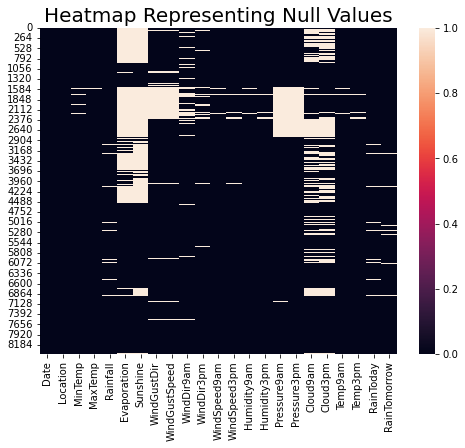

In [13]:
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.title("Heatmap Representing Null Values",fontsize=20)

# Checking Unique Values

### 1. Categorical Columns

In [14]:
for i in df.columns:
    if df[i].dtype=='object':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  Date 

['2008-12-01' '2008-12-02' '2008-12-03' ... '2013-06-06' '2013-06-07'
 '2013-06-08']
**************************************************
Column  Location 

['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']
**************************************************
Column  WindGustDir 

['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']
**************************************************
Column  WindDir9am 

['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']
**************************************************
Column  WindDir3pm 

['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' nan 'NE']
**************************************************
Column  RainToday 

['No' 'Yes' nan]
**************************************************
Column  RainTomorrow 

['No' 'Yes' nan]
*******************

In [15]:
# Shows Nan Values in RainToday, RainTomorrow

### 2. Numerical Columns 

In [16]:
for i in df.columns:
    if df[i].dtype=='float64':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  MinTemp 

[13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1 15.9 12.6  8.4  9.8
 14.1 13.5 11.2 11.5 17.1 20.5 15.3 16.2 16.9 20.1 19.7 12.5 12.  11.3
  9.6 10.5 12.3 13.7 16.1 14.  17.  17.3 17.2 17.4 19.8 14.9 13.9 18.6
 19.3 24.4 18.8 20.8 15.7 18.5 20.4 21.8 22.3 22.  28.  21.5 21.7 23.5
 28.3 18.4 12.4 13.3 18.  18.7 15.5  8.9 15.  15.4 16.  12.8 13.2 13.8
  7.6  8.3 11.  20.9 16.4 10.   8.8  9.3 14.4 10.8 10.1  9.1 10.4 12.2
 10.7  7.8  8.1  7.5  8.2 11.6 13.   9.9  3.5  6.6  7.   5.7  6.2  6.
 10.6  8.6  4.5  5.4  2.1  1.8  7.2  4.6  4.2  5.2  4.1  3.2  4.3  3.7
  3.6  6.9 10.3  3.   2.6  5.1  4.4  4.7  6.7  8.   2.2  1.7  2.8  9.
  6.3 -2.  -1.3  2.   0.5  1.2  0.6  0.9  5.   3.9  3.4  0.  -1.5 -1.7
 -0.4  0.1  4.8  5.9  2.9 -0.6 -0.3 -1.   0.8 -0.1  1.3  3.3  6.5 -0.8
  1.9  6.8  2.7  1.6  5.5  7.3  0.2  5.8  7.1  1.1  1.   6.1  nan  5.3
  4.  11.7  8.5  3.8  6.4  9.5 14.5 15.6 17.8 16.7 18.1 12.1 11.4 18.3
 11.9 21.  11.1 18.2 14.2 11.8 13.6 12.7 15.1 22.9 17.6 21.1 

In [17]:
# float64 shows nan values in their columns

# Checking the duplicated value in DataFrame

In [18]:
df.duplicated().sum()

1663

### Observation: Shows 1663 duplicated rows 

In [19]:
df[df.duplicated()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
3679,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
3680,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
3681,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
3682,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
3683,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


### Duplicate rows varies with change in columns

In [20]:
df.duplicated(subset=['Temp3pm']).value_counts()

True     8096
False     329
dtype: int64

In [21]:
df.duplicated(subset=['Temp3pm','WindDir3pm']).value_counts()

True     5381
False    3044
dtype: int64

### Checking Non- Duplicated Rows

In [22]:
(~df.duplicated()).sum()

6762

In [23]:
df.loc[df.duplicated(keep='first'), :]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
3679,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
3680,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
3681,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
3682,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
3683,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


In [24]:
df.loc[df.duplicated(keep='last'), :]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2822,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
2823,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
2824,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
2825,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
2826,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
2827,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
2828,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
2829,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
2830,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
2831,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


# NOTE:
- Duplicated rows have been determined. We will proceed and delete the rows

# Droping Duplicate Rows

In [25]:
df.drop_duplicates(inplace=True)

In [26]:
df.duplicated().sum()

0

In [27]:
df.shape

(6762, 23)

# Percentage of Missing Data

In [28]:
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

In [29]:
for i in df.columns:
    Total_Value=len(df[i])
    Missing_Value=df[i].isnull().sum()
    print(i ,"Missing percentage :",round(((Missing_Value/Total_Value)*100),2))

Date Missing percentage : 0.0
Location Missing percentage : 0.0
MinTemp Missing percentage : 1.04
MaxTemp Missing percentage : 0.84
Rainfall Missing percentage : 2.04
Evaporation Missing percentage : 43.2
Sunshine Missing percentage : 47.86
WindGustDir Missing percentage : 13.93
WindGustSpeed Missing percentage : 13.93
WindDir9am Missing percentage : 11.74
WindDir3pm Missing percentage : 4.35
WindSpeed9am Missing percentage : 0.93
WindSpeed3pm Missing percentage : 1.48
Humidity9am Missing percentage : 0.8
Humidity3pm Missing percentage : 1.42
Pressure9am Missing percentage : 19.34
Pressure3pm Missing percentage : 19.39
Cloud9am Missing percentage : 27.6
Cloud3pm Missing percentage : 28.13
Temp9am Missing percentage : 0.75
Temp3pm Missing percentage : 1.36
RainToday Missing percentage : 2.04
RainTomorrow Missing percentage : 2.04


# Replacing Null Values

In [30]:
from sklearn.impute import SimpleImputer
si_cat=SimpleImputer(missing_values=np.nan,strategy='most_frequent')
si_num=SimpleImputer(missing_values=np.nan,strategy='median')

#  Replace Categorical Variable
for i in df.columns:
    if df[i].dtype=='object':
        df[i]=si_cat.fit_transform(df[i].values.reshape(-1,1))
        
# Replace Numerical and float value:

for i in df.columns:
    if df[i].dtype=='float64':
        df[i]=si_num.fit_transform(df[i].values.reshape(-1,1))

In [31]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [32]:
df['RainTomorrow'].unique()

array(['No', 'Yes'], dtype=object)

Text(0.5, 1.0, ' Heat Showing Null Missing value ')

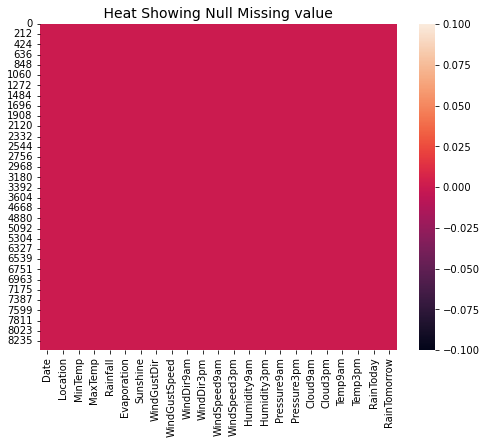

In [33]:
# Visualization on heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.title(" Heat Showing Null Missing value ", fontsize=14)

# EDA (Exploratory Data Analysis)

# Univariate Analysis

Name of the location of the weather station
 PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


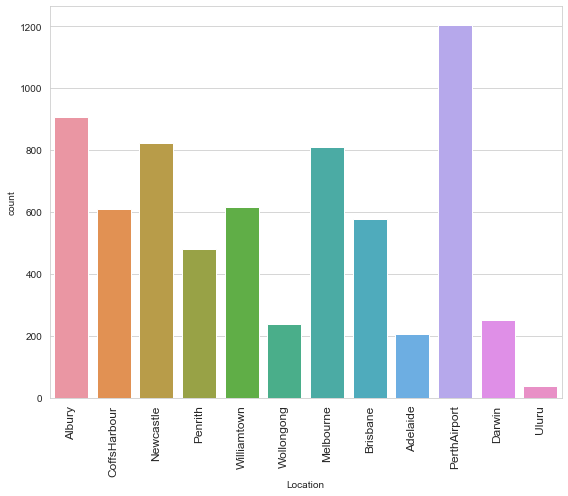

In [34]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='Location',data=df)
print("Name of the location of the weather station\n",df['Location'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Graph Location Shows:

- PerthAirport    1204
- Albury           907
- Newcastle        822
- Melbourne        811
- Williamtown      615
- CoffsHarbour     611
- Brisbane         579
- Penrith          482
- Darwin           250
- Wollongong       237
- Adelaide         205
- Uluru             39

### Maximum prediction is done from Perth Airport weather station and Uluru Shows the lowest prediction.

Minimum Temp  -2.0 Maximum Temp  28.5


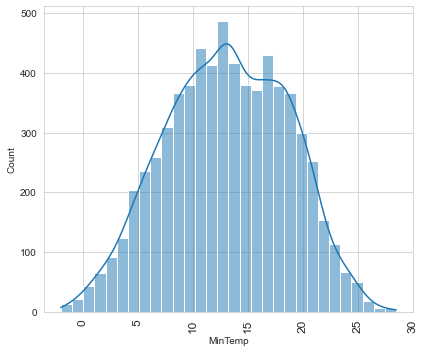

In [35]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='MinTemp',data=df,bins=30,kde=True)
print("Minimum Temp ",df['MinTemp'].min(),"Maximum Temp ",df['MinTemp'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Column MinTemp shows:  
- Minimum Temp  -2.0
- Maximum Temp  28.5

#### Maximum Frequency/counts Lies between 10 to 15

Minimum Temp  8.2 Maximum Temp  45.5


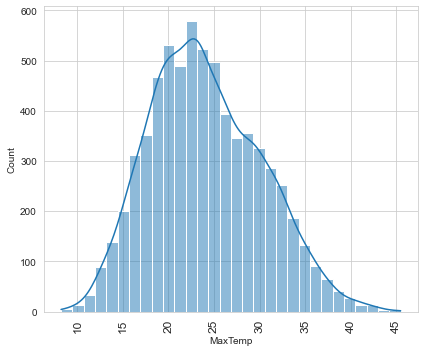

In [36]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='MaxTemp',data=df,bins=30,kde=True)
print("Minimum Temp ",df['MaxTemp'].min(),"Maximum Temp ",df['MaxTemp'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

MaxTemp Column Shows:

- Minimum Temp  8.2 
- Maximum Temp  45.5

#### Maximum MaxTemp lies between 20 to 25. 

Minimum Rainfall  0.0 Maximum Rainfall  371.0


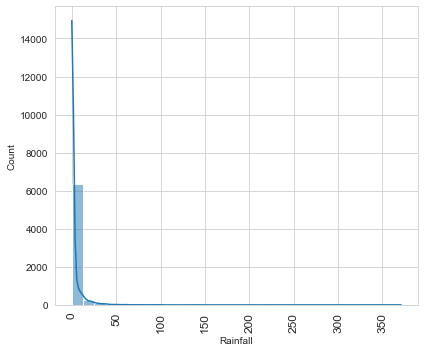

In [37]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Rainfall',data=df,bins=30,kde=True)
print("Minimum Rainfall ",df['Rainfall'].min(),"Maximum Rainfall ",df['Rainfall'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Frequency lies between 0 to 50

#### Rainfall Graph Shows " Minimum Rainfall  0.0 Maximum Rainfall  371.0

Minimum Evaporation  0.0 Maximum Evaporation  145.0


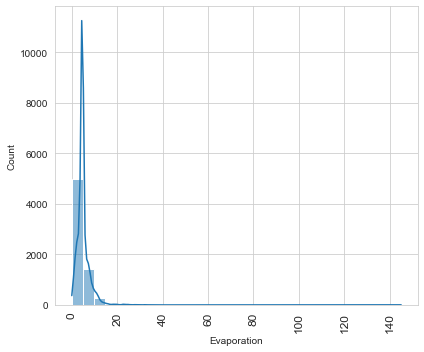

In [38]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Evaporation',data=df,bins=30,kde=True)
print("Minimum Evaporation ",df['Evaporation'].min(),"Maximum Evaporation ",df['Evaporation'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Evaporation count lies between 0 to 15

#### Minimum Evaporation  0.0 Maximum Evaporation  145.0

Minimum Sunshine  0.0 Maximum Sunshine  13.9


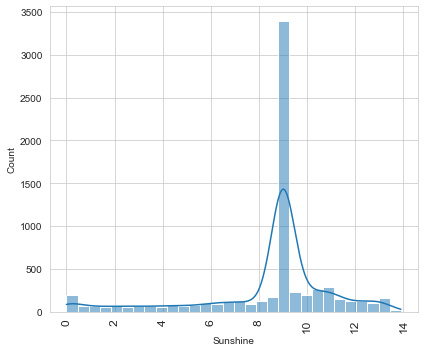

In [39]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Sunshine',data=df,bins=30,kde=True)
print("Minimum Sunshine ",df['Sunshine'].min(),"Maximum Sunshine ",df['Sunshine'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Frequency lies between 8 to 10

#### Minimum Sunshine  0.0 Maximum Sunshine  13.9

The direction of the strongest wind gust in the 24 hours to midnight
 E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


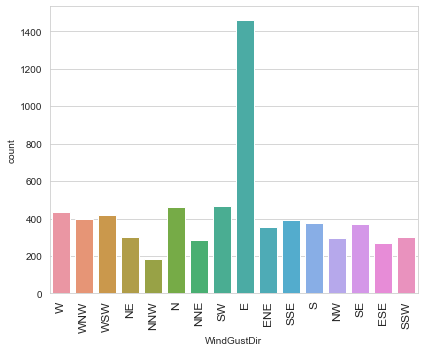

In [40]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='WindGustDir',data=df)
print("The direction of the strongest wind gust in the 24 hours to midnight\n",df['WindGustDir'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Column Shows:

- E      1460
- SW      465
- N       459
- W       434
- WSW     420
- WNW     398
- SSE     390
- S       376
- SE      370
- ENE     357
- NE      300
- SSW     299
- NW      296
- NNE     287
- ESE     267
- NNW     184

#### Brief increase in the speed towards  East Direction having Maximum Count  1460 and Minimum Counts toward NNW 184

Minimum WindGustSpeed  7.0 Maximum WindGustSpeed  107.0


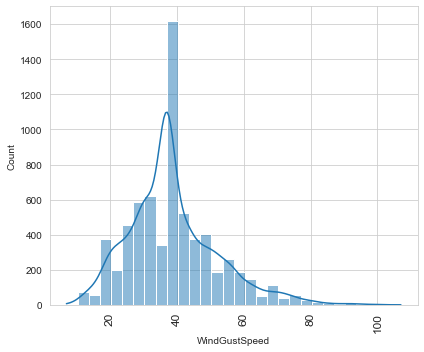

In [41]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='WindGustSpeed',data=df,bins=30,kde=True)
print("Minimum WindGustSpeed ",df['WindGustSpeed'].min(),"Maximum WindGustSpeed ",df['WindGustSpeed'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

- Minimum WindGustSpeed is 7.0 
- Maximum WindGustSpeed is 107.0

#### Brief increase in the speed of the wind Maximum Frequency lies between  30 to 40

The Direction of the wind at 9am
 N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


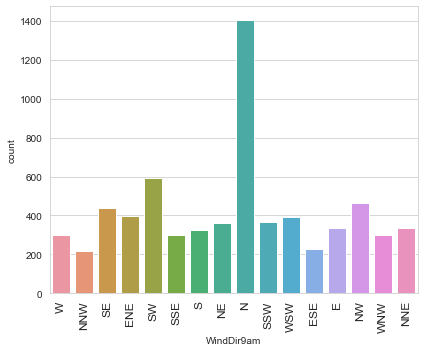

In [42]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='WindDir9am',data=df)
print("The Direction of the wind at 9am\n",df['WindDir9am'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

The Direction of the wind at 9 am shows various directions counts
- N      1403
- SW      590
- NW      463
- SE      439
- ENE     397
- WSW     394
- SSW     368
- NE      364
- E       338
- NNE     337
- S       324
- WNW     301
- SSE     300
- W       299
- ESE     229
- NNW     216

Maximum Wind at 9 am blows through North.

The Direction of the wind at 3pm 
 SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


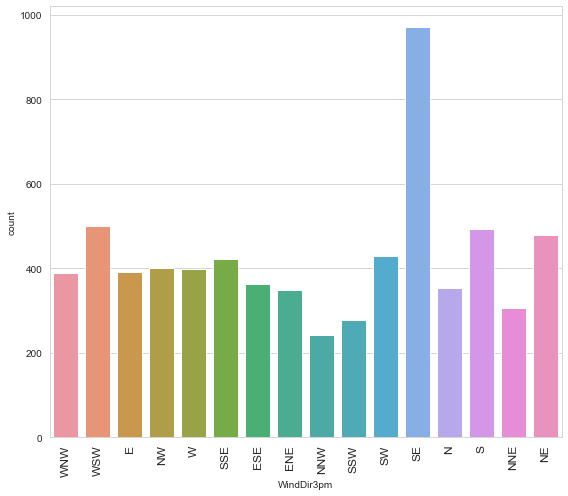

In [43]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='WindDir3pm',data=df)
print("The Direction of the wind at 3pm \n",df['WindDir3pm'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

The Direction of the wind at 3pm shows various Direction Wind Flow. 
- SE     971
- WSW    499
- S      493
- NE     480
- SW     428
- SSE    421
- NW     400
- W      399
- E      392
- WNW    389
- ESE    363
- N      354
- ENE    348
- NNE    305
- SSW    277
- NNW    243

#### Maximum Winds Blows towards South East, North-NorthWest Shows

Minimum Wind Speed at 9am  0.0 Maximum Wind Speed at 9am  63.0


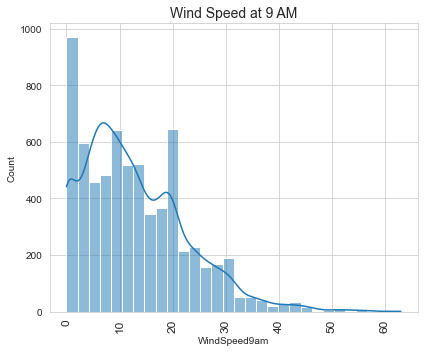

In [44]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='WindSpeed9am',data=df,bins=30,kde=True)
print("Minimum Wind Speed at 9am ",df['WindSpeed9am'].min(),"Maximum Wind Speed at 9am ",df['WindSpeed9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Wind Speed at 9am  0.0
- Maximum Wind Speed at 9am  63.0

#### Maximum Wind Speed By 9 AM lies 0 to 10 followed by 10 to 20

Minimum Wind Speed at 3pm  0.0 Maximum Wind Speed at 3pm  83.0


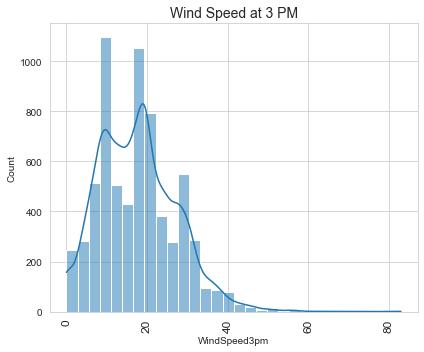

In [45]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='WindSpeed3pm',data=df,bins=30,kde=True)
print("Minimum Wind Speed at 3pm ",df['WindSpeed3pm'].min(),"Maximum Wind Speed at 3pm ",df['WindSpeed3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Wind Speed at 3 PM",fontsize=14)
plt.tight_layout()

- Minimum Wind Speed at 3pm  00.0 
- Maximum Wind Speed at 3pm  83.0

#### Maximum Wind Speed Frequency lies between 10 to 20

Minimum Humidity at 9am  10.0 Maximum Humidity at 9am  100.0


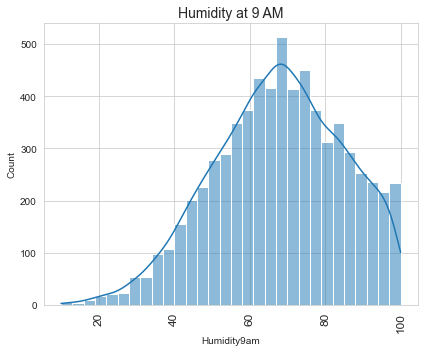

In [46]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Humidity9am',data=df,bins=30,kde=True)
print("Minimum Humidity at 9am ",df['Humidity9am'].min(),"Maximum Humidity at 9am ",df['Humidity9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Humidity at 9 AM",fontsize=14)
plt.tight_layout()

Minimum Humidity at 9am  10.0
Maximum Humidity at 9am  100.0

Minimum Humidity at 3PM 6.0 Maximum Humidity3pm  99.0


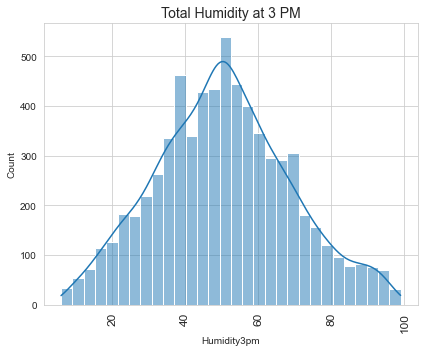

In [47]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Humidity3pm',data=df,bins=30,kde=True)
print("Minimum Humidity at 3PM",df['Humidity3pm'].min(),"Maximum Humidity3pm ",df['Humidity3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Total Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Humidity at 3PM 6.0 Maximum Humidity3pm  99.0

Minimum Pressure at 9am  989.8 Maximum Pressure at 9am  1039.0


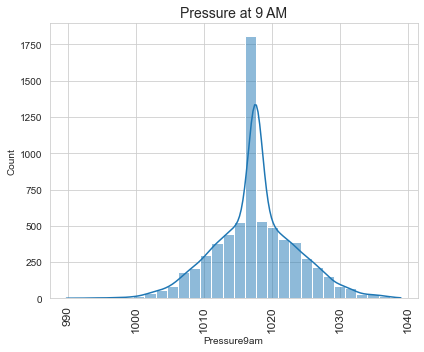

In [48]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Pressure9am',data=df,bins=30,kde=True)
print("Minimum Pressure at 9am ",df['Pressure9am'].min(),"Maximum Pressure at 9am ",df['Pressure9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Pressure at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Pressure at 9am  989.8 
- Maximum Pressure at 9am  1039.0

#### Maximum PRESSURE LIES at 9AM between 105 to 1021

Minimum Pressure at 3pm  982.9 Maximum Pressure at 3pm  1036.0


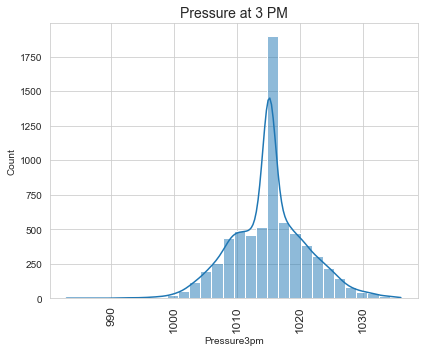

In [49]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Pressure3pm',data=df,bins=30,kde=True)
print("Minimum Pressure at 3pm ",df['Pressure3pm'].min(),"Maximum Pressure at 3pm ",df['Pressure3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Pressure at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Pressure at 3pm  982.9
Maximum Pressure at 3pm  1036.0

Minimum Cloud At 9 AM  0.0 Maximum Cloud At 9 AM  8.0


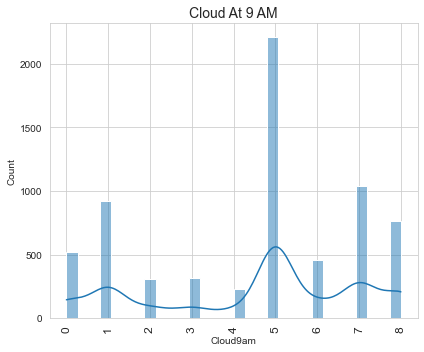

In [50]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Cloud9am',data=df,bins=30,kde=True)
print("Minimum Cloud At 9 AM ",df['Cloud9am'].min(),"Maximum Cloud At 9 AM ",df['Cloud9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Cloud At 9 AM",fontsize=14)
plt.tight_layout()

Minimum Cloud At 9 AM  0.0 
Maximum Cloud At 9 AM  8.0

Maximum frequency lies at 5

Minimum Temp at 3PM  7.3 Maximum Temp st 3 PM 44.1


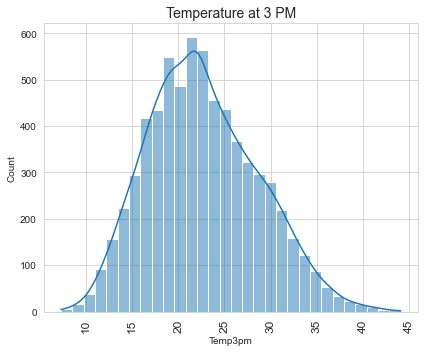

In [51]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Temp3pm',data=df,bins=30,kde=True)
print("Minimum Temp at 3PM ",df['Temp3pm'].min(),"Maximum Temp st 3 PM",df['Temp3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Temperature at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Temp at 3PM  7.3
Maximum Temp st 3 PM 44.1

Minimum Temp at 9 AM  1.9 Maximum Temperature at 9 AM  39.4


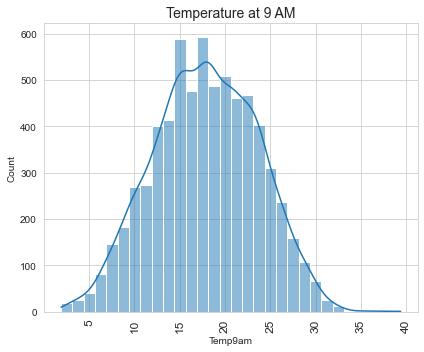

In [52]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Temp9am',data=df,bins=30,kde=True)
print("Minimum Temp at 9 AM ",df['Temp9am'].min(),"Maximum Temperature at 9 AM ",df['Temp9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Temperature at 9 AM",fontsize=14)
plt.tight_layout()

Minimum Temp at 9 AM  1.9 
Maximum Temperature at 9 AM  39.4

 Counts Showing Rain 
 No     5190
Yes    1572
Name: RainToday, dtype: int64


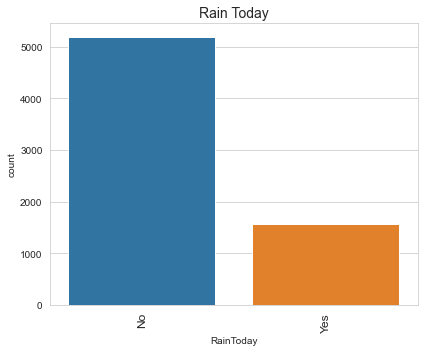

In [53]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='RainToday',data=df)
print(" Counts Showing Rain \n",df['RainToday'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Rain Today",fontsize=14)
plt.tight_layout()

Counts Showing Rain 
- No     5190
- Yes    1572

 Counts Showing Rain Tomorrow 
 No     5190
Yes    1572
Name: RainTomorrow, dtype: int64


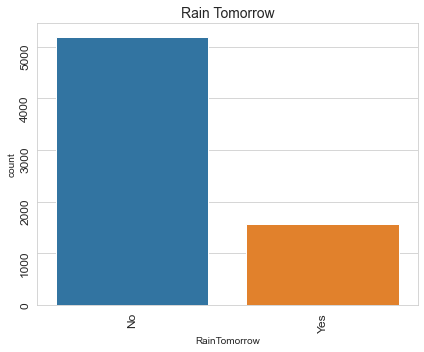

In [54]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='RainTomorrow',data=df)
print(" Counts Showing Rain Tomorrow \n",df['RainTomorrow'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=90,fontsize=12)
plt.title("Rain Tomorrow",fontsize=14)
plt.tight_layout()

Counts Showing Rain Tomorrow 
No     5190
Yes    1572

# Bi-Variate Analysis

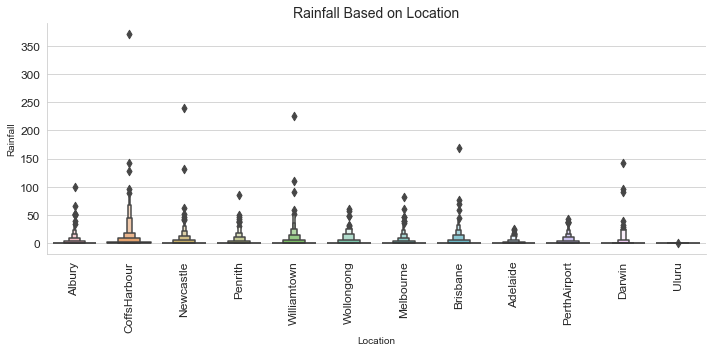

In [55]:
sns.catplot(kind='boxen',x='Location',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Location",fontsize=14)
plt.tight_layout()

Adelaide shows lowest rainfall and CoffsHarbour Shows Maximum Rain

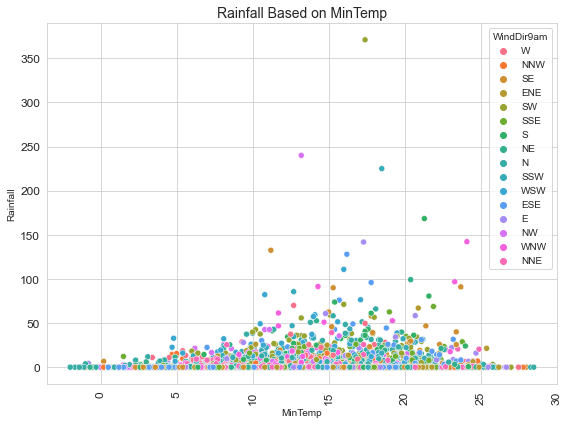

In [57]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='MinTemp',y='Rainfall',hue='WindDir9am',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum rain lies between Min Temp 10 to 20

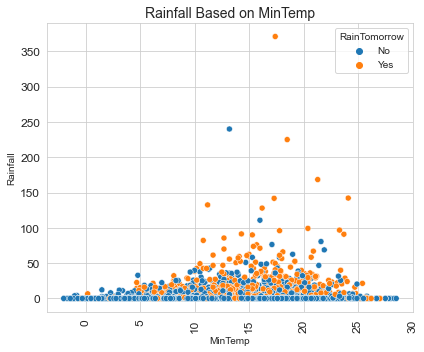

In [58]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='MinTemp',y='Rainfall',data=df,hue='RainTomorrow')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum rain lies between Min Temp 10 to 20

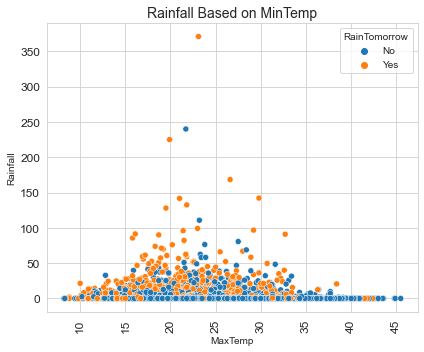

In [59]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='MaxTemp',y='Rainfall',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

As MaximumTemperature shows Maximum rainfall in Temp range 15 to 25 shows maximum rain.

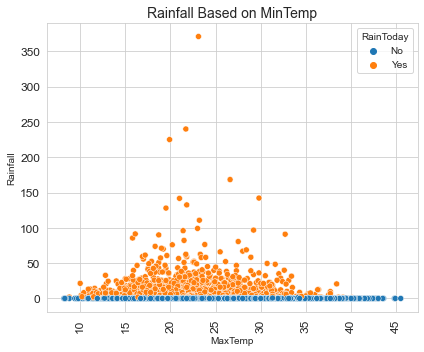

In [60]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='MaxTemp',y='Rainfall',hue='RainToday',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Max temperature increase cases rain between 15 to 30 max temperature cause rain, Temperature ranges 35 to 45 cause less rain

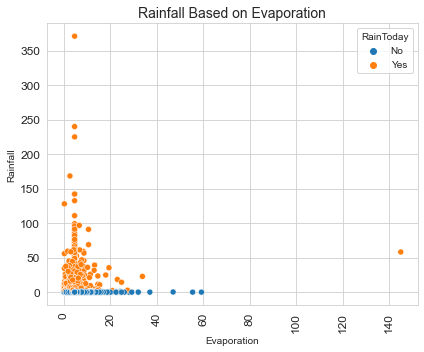

In [61]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Evaporation',y='Rainfall',hue='RainToday',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Evaporation",fontsize=14)
plt.tight_layout()

Humidity is one of the cause of rainfall

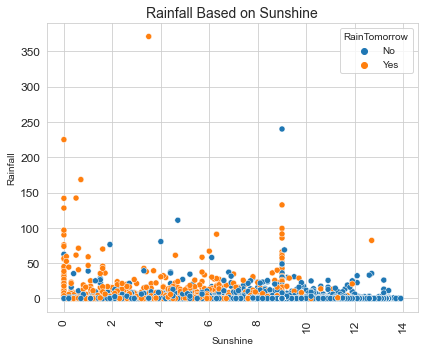

In [62]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Sunshine',y='Rainfall',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Sunshine",fontsize=14)
plt.tight_layout()

High chance rain at 9

<Figure size 432x360 with 0 Axes>

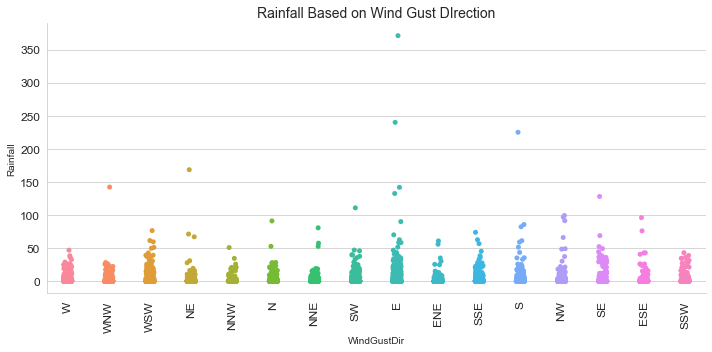

In [63]:
plt.figure(figsize=(6,5))
sns.catplot(x='WindGustDir',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Gust DIrection",fontsize=14)
plt.tight_layout()

 Wind Gust Direction Shows East, WSW plays an important factor for rain followed by others 

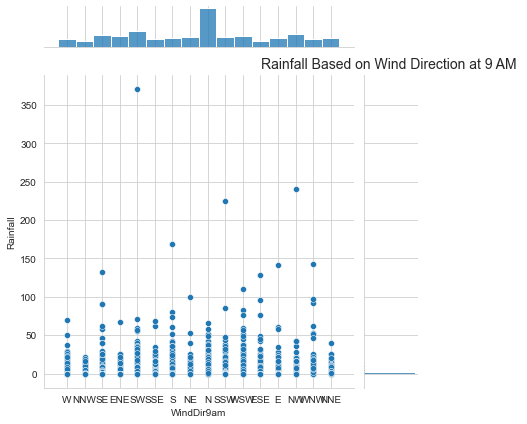

In [64]:
sns.jointplot(x='WindDir9am',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Direction at 9 AM ",fontsize=14)
plt.tight_layout()

North plays an import role for Rain

<Figure size 576x432 with 0 Axes>

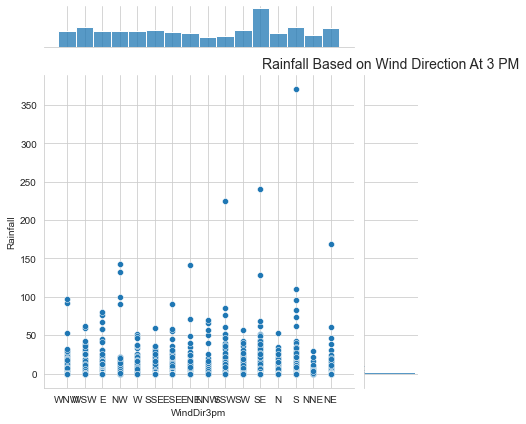

In [65]:
plt.figure(figsize=(8,6))
sns.jointplot(x='WindDir3pm',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Direction At 3 PM",fontsize=14)
plt.tight_layout()

South East Wind Plays an important role for rain

<Figure size 576x432 with 0 Axes>

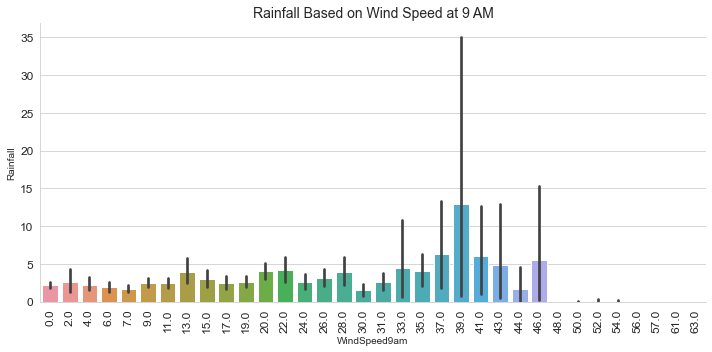

In [66]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindSpeed9am',y='Rainfall',data=df,aspect=2,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

Maximum High reported is 39

<Figure size 576x432 with 0 Axes>

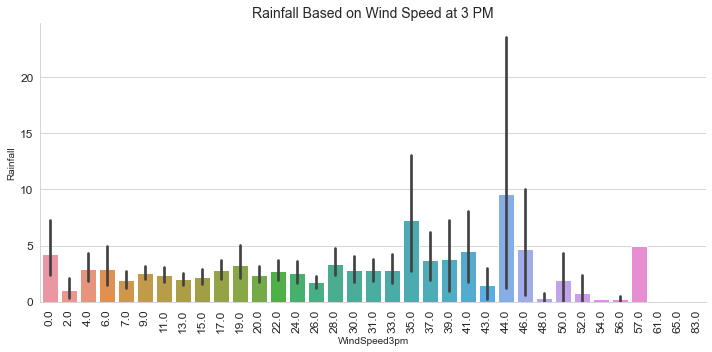

In [67]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindSpeed3pm',y='Rainfall',data=df,aspect=2,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Speed at 3 PM",fontsize=14)
plt.tight_layout()

Rainfall Based on Wind Speed at 3 PM Maximum wind Speed recorded is 44.

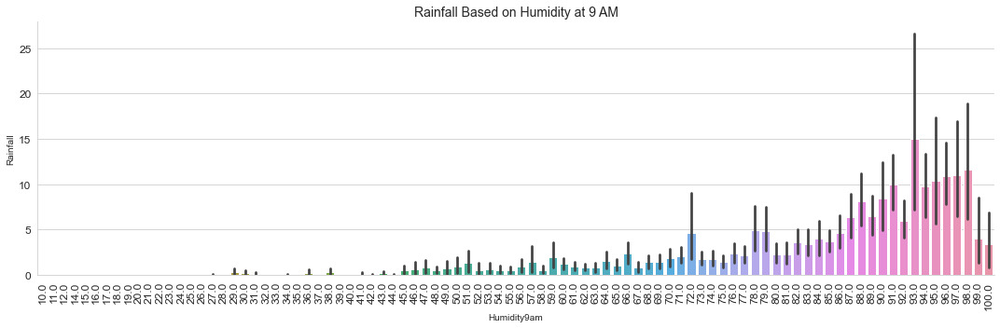

In [68]:
sns.catplot(x='Humidity9am',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Humidity at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Humidity Recorded at 93 at 9PM

<Figure size 576x432 with 0 Axes>

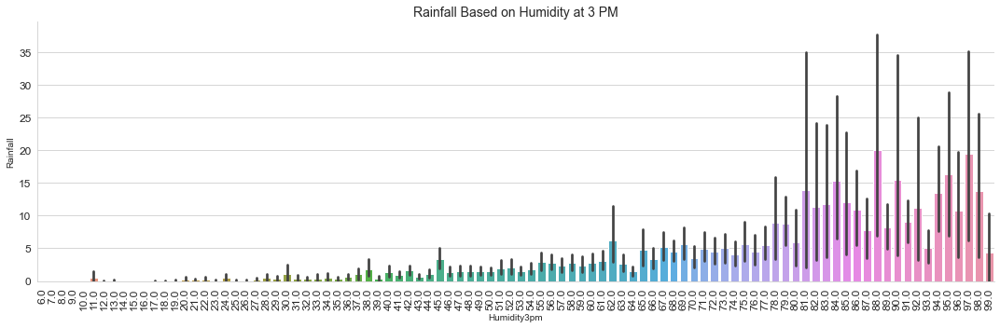

In [69]:
plt.figure(figsize=(8,6))
sns.catplot(x='Humidity3pm',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Maximum Humidity is recorded is between 81 to 98

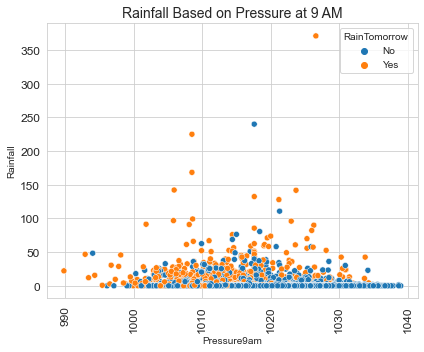

In [71]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Pressure9am',y='Rainfall',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Pressure at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Pressure 9am shows Rain 1010 and 1020

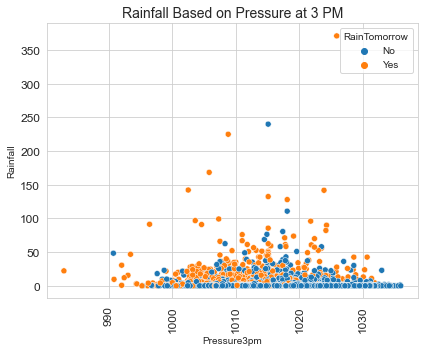

In [72]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=df,hue='RainTomorrow')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Pressure at 3 PM",fontsize=14)
plt.tight_layout()

Shows Maximum Rain is between 1000 to 1010

<Figure size 360x432 with 0 Axes>

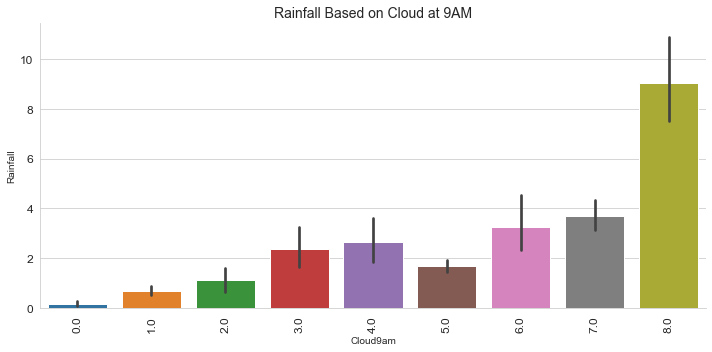

In [73]:
sns.catplot(x='Cloud9am',y='Rainfall',data=df,aspect=2,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Cloud at 9AM",fontsize=14)
plt.tight_layout()

Maximum rain at 8

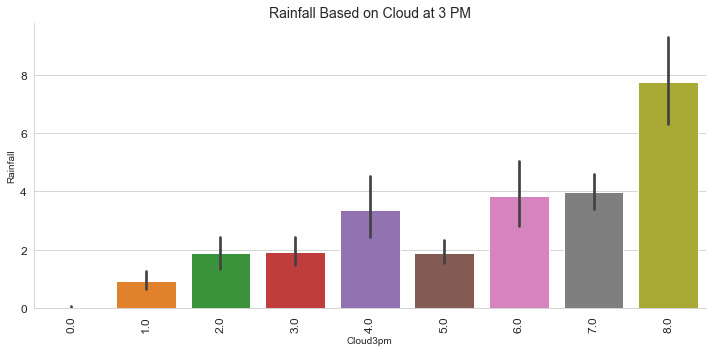

In [74]:
sns.catplot(x='Cloud3pm',y='Rainfall',data=df,aspect=2,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Cloud at 3 PM",fontsize=14)
plt.tight_layout()

Cloud3pm shows maximum rain at 3pm

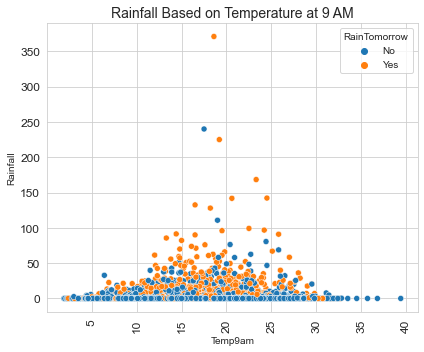

In [75]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Temp9am',y='Rainfall',data=df,hue='RainTomorrow')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Temperature at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Temp at 9 am is between 15 to 25

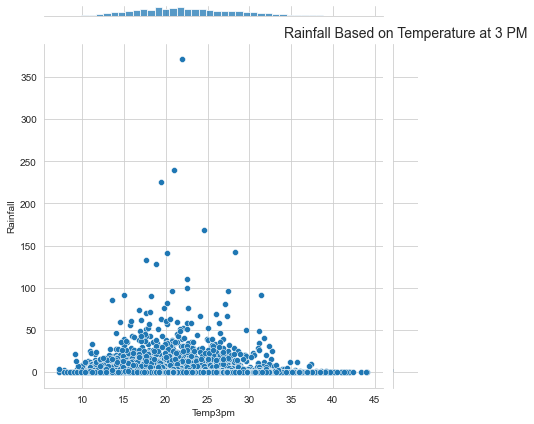

In [76]:
sns.jointplot(x='Temp3pm',y='Rainfall',data=df,ratio=10,kind='scatter')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Temperature at 3 PM",fontsize=14)
plt.tight_layout()

Temperature3pm Shows fro 15 to 30 is high and good chance of rain

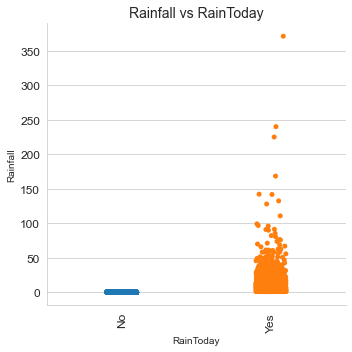

In [77]:
sns.catplot(x='RainToday',y='Rainfall',data=df,aspect=1,kind='strip')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall vs RainToday",fontsize=14)
plt.tight_layout()

Graph Shows Maximum rain is yes

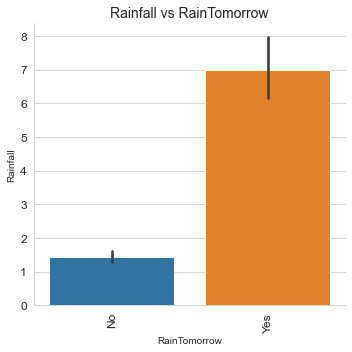

In [78]:
sns.catplot(x='RainTomorrow',y='Rainfall',data=df,aspect=1,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall vs RainTomorrow",fontsize=14)
plt.tight_layout()

Rain Shows Maximum rain Rain is tomorrow

### RainTomorrow Vs Other Aspects

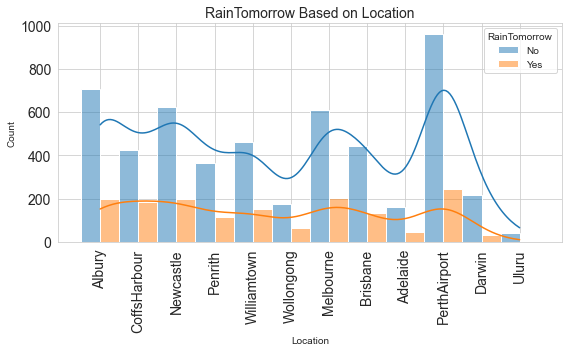

In [79]:
plt.figure(figsize=(8,5))
sns.histplot(x='Location',hue='RainTomorrow',data=df,kde=True,multiple='dodge',element='bars')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Location",fontsize=14)
plt.tight_layout()

Maximum Rain Based on loction is  PerthAirport Followed by albury CoffsHarbour and Newcastle and other

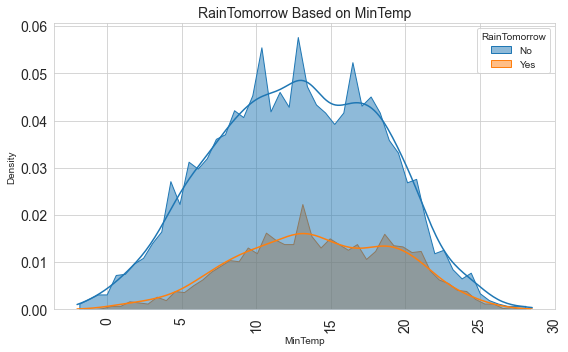

In [80]:
plt.figure(figsize=(8,5))
sns.histplot(x='MinTemp',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum Rain is between 10 to 20

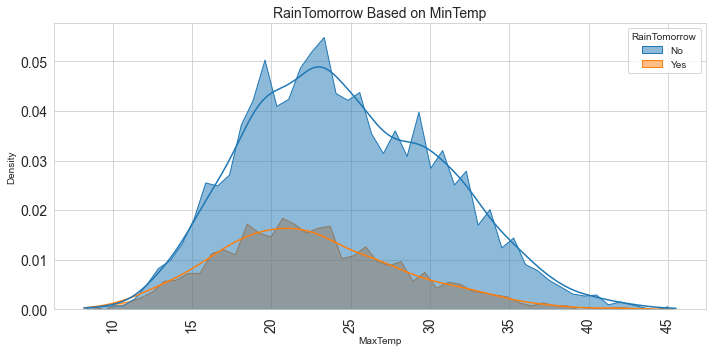

In [81]:
plt.figure(figsize=(10,5))
sns.histplot(x='MaxTemp',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on MinTemp",fontsize=14)
plt.tight_layout()

max Temp lies between 15 to 25 shows Rain tomorrow would would be high

<Figure size 432x360 with 0 Axes>

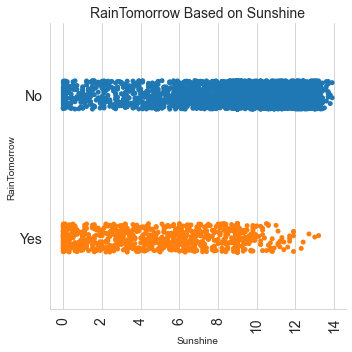

In [82]:
plt.figure(figsize=(6,5))
sns.catplot(x='Sunshine',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Sunshine",fontsize=14)
plt.tight_layout()

Sunshine shows that chance of rain is less after 12

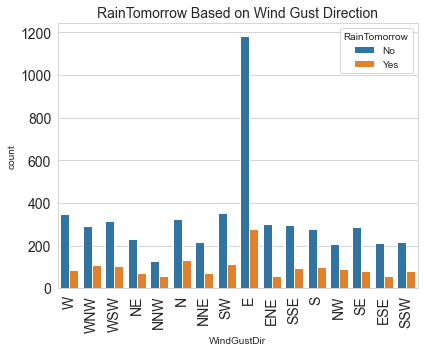

In [83]:
plt.figure(figsize=(6,5))
sns.countplot(x='WindGustDir',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Gust Direction",fontsize=14)
plt.tight_layout()

East Wind Gust Direction Shows high chance of Rainfall followed by others

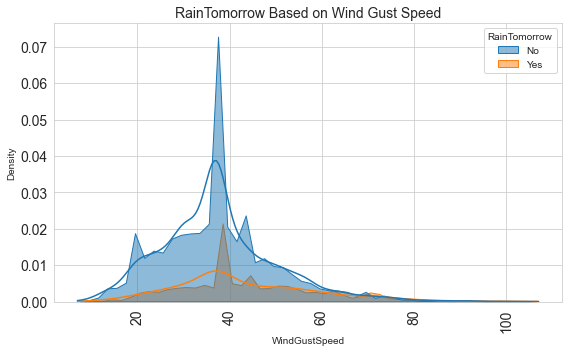

In [84]:
plt.figure(figsize=(8,5))
sns.histplot(x='WindGustSpeed',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Gust Speed",fontsize=14)
plt.tight_layout()

Chance of rainfall is very high if speed of wind is 40

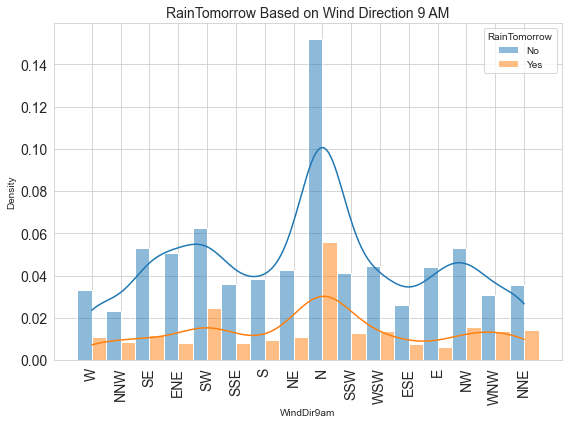

In [85]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindDir9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='bars')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Direction 9 AM",fontsize=14)
plt.tight_layout()

Maximum Wind Blow through North Shows high chance of rain

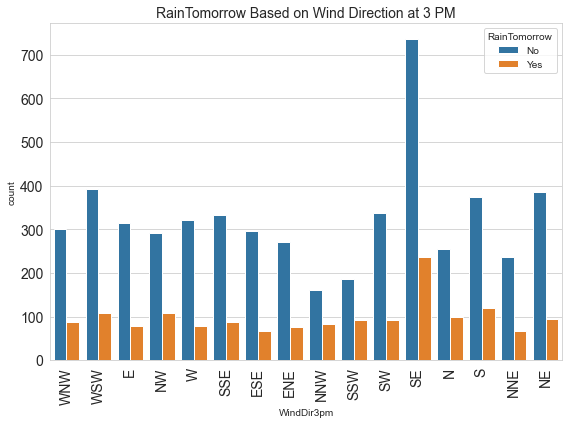

In [86]:
plt.figure(figsize=(8,6))
sns.countplot(x='WindDir3pm',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Direction at 3 PM",fontsize=14)
plt.tight_layout()

Maximum Wind blew through South East and North

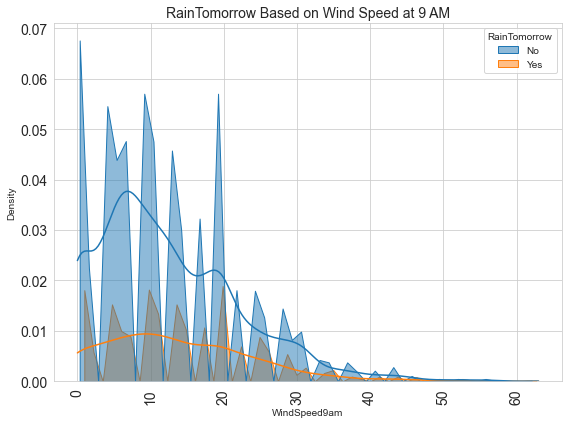

In [87]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindSpeed9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

Windspeed 10 to 20 Shows Maximum Rain

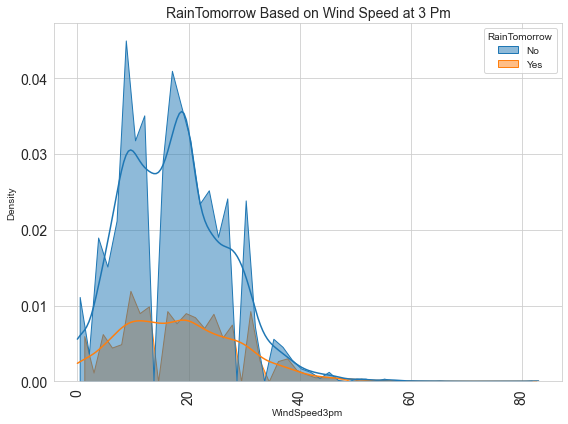

In [88]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindSpeed3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Speed at 3 Pm",fontsize=14)
plt.tight_layout()

Wind Speed is max between 0 to 30 causes maximum Rain Tomorrow

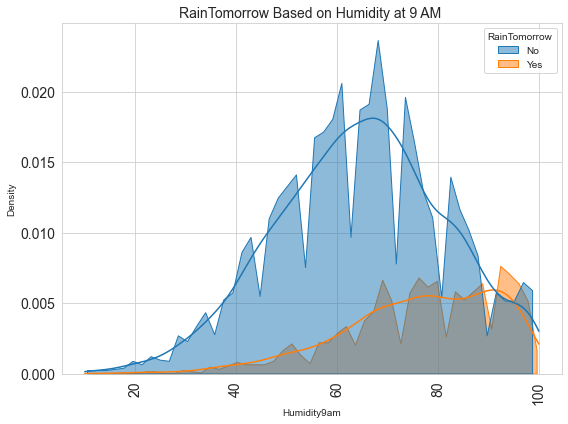

In [89]:
plt.figure(figsize=(8,6))
sns.histplot(x='Humidity9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Humidity at 9 AM ",fontsize=14)
plt.tight_layout()

Maximum Humidity at 9am at 70 to 100 is high

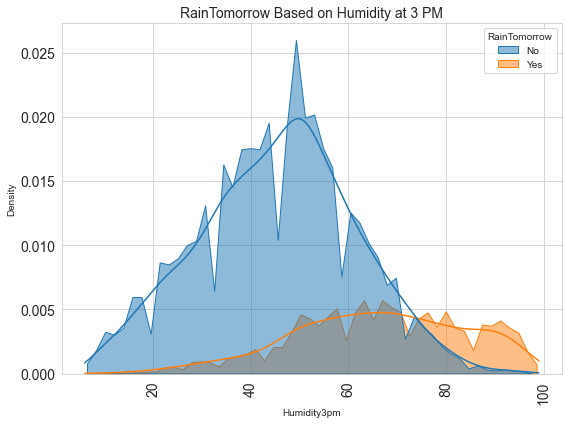

In [90]:
plt.figure(figsize=(8,6))
sns.histplot(x='Humidity3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Humidity causes maximum rain is 80 to 100

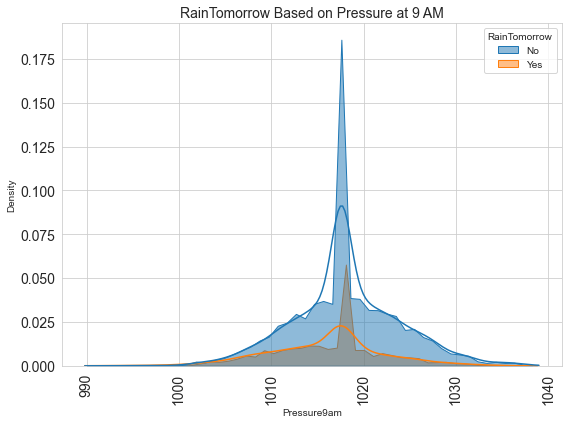

In [91]:
plt.figure(figsize=(8,6))
sns.histplot(x='Pressure9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Pressure at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Pressure at 9am

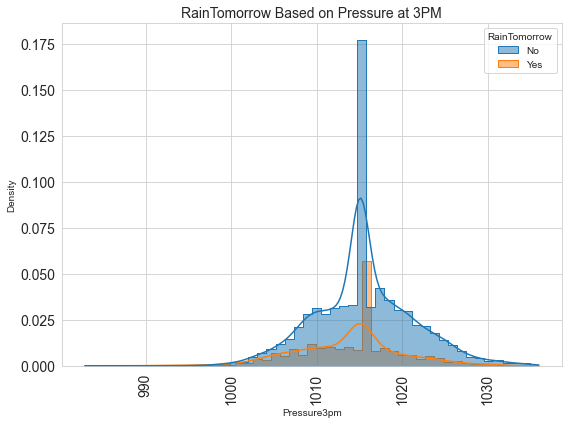

In [92]:
plt.figure(figsize=(8,6))
sns.histplot(x='Pressure3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='step')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Pressure at 3PM",fontsize=14)
plt.tight_layout()

Maximum Pressure lies at 3 pm lies between 1010 to 1020 

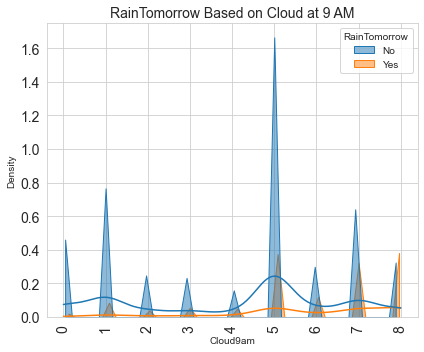

In [93]:
plt.figure(figsize=(6,5))
sns.histplot(x='Cloud9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='poly')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Cloud at 9 AM",fontsize=14)
plt.tight_layout()

Cloud9am shows maximum rain at 8 am

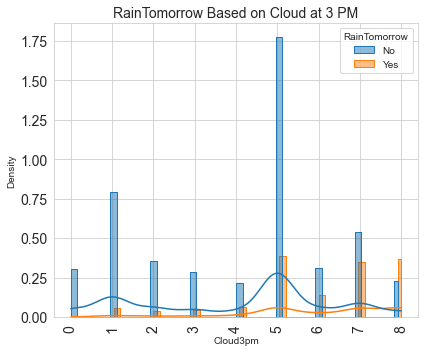

In [94]:
plt.figure(figsize=(6,5))
sns.histplot(x='Cloud3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge',stat='density',bins=50,element='step')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Cloud at 3 PM",fontsize=14)
plt.tight_layout()

Cloud3pm ,Shows maximum rain at 5 and 7 

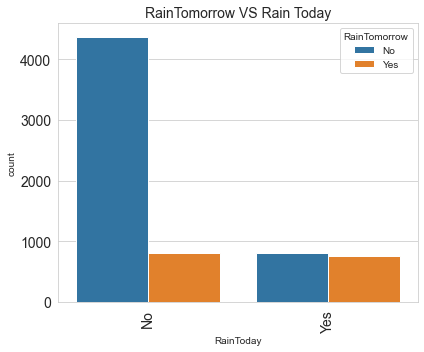

In [95]:
plt.figure(figsize=(6,5))
sns.countplot(x='RainToday',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

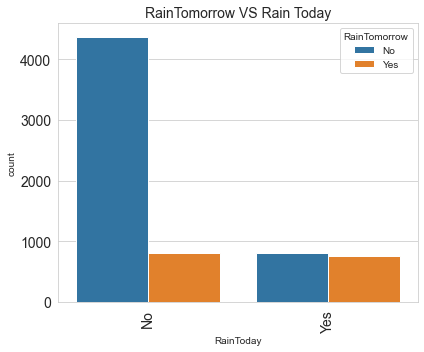

In [96]:
plt.figure(figsize=(6,5))
sns.countplot(x='RainToday',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

RainTomorrow     No    Yes
Location                  
Adelaide      160.0   45.0
Albury        708.0  199.0
Brisbane      444.0  135.0
CoffsHarbour  425.0  186.0
Darwin        218.0   32.0
Melbourne     608.0  203.0
Newcastle     624.0  198.0
Penrith       366.0  116.0
PerthAirport  962.0  242.0
Uluru          39.0    NaN
Williamtown   462.0  153.0
Wollongong    174.0   63.0


Text(0.5, 1.0, 'Chance Of Rain As per Loacation')

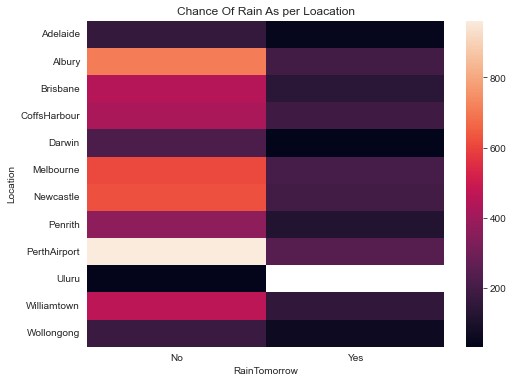

In [97]:
inf=df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack()
print(inf)
plt.figure(figsize=(8,6))
sns.heatmap(inf)
plt.title("Chance Of Rain As per Loacation")

RainToday        No    Yes
Location                  
Adelaide      161.0   44.0
Albury        708.0  199.0
Brisbane      444.0  135.0
CoffsHarbour  424.0  187.0
Darwin        217.0   33.0
Melbourne     609.0  202.0
Newcastle     624.0  198.0
Penrith       366.0  116.0
PerthAirport  962.0  242.0
Uluru          39.0    NaN
Williamtown   462.0  153.0
Wollongong    174.0   63.0


Text(0.5, 1.0, 'Chance Of Rain Today As per Loacation')

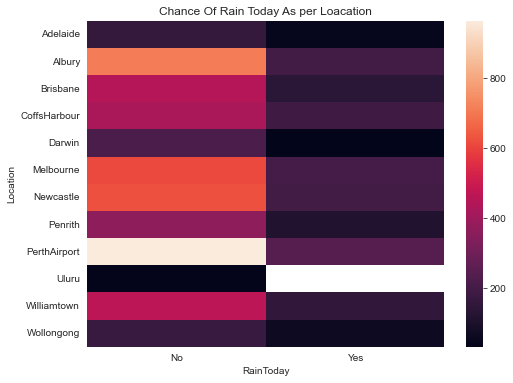

In [98]:
rain_today=df.groupby(["Location"])["RainToday"].value_counts().sort_values().unstack()
print(rain_today)
plt.figure(figsize=(8,6))
sns.heatmap(rain_today)
plt.title("Chance Of Rain Today As per Loacation")

# Multivariate Analysis

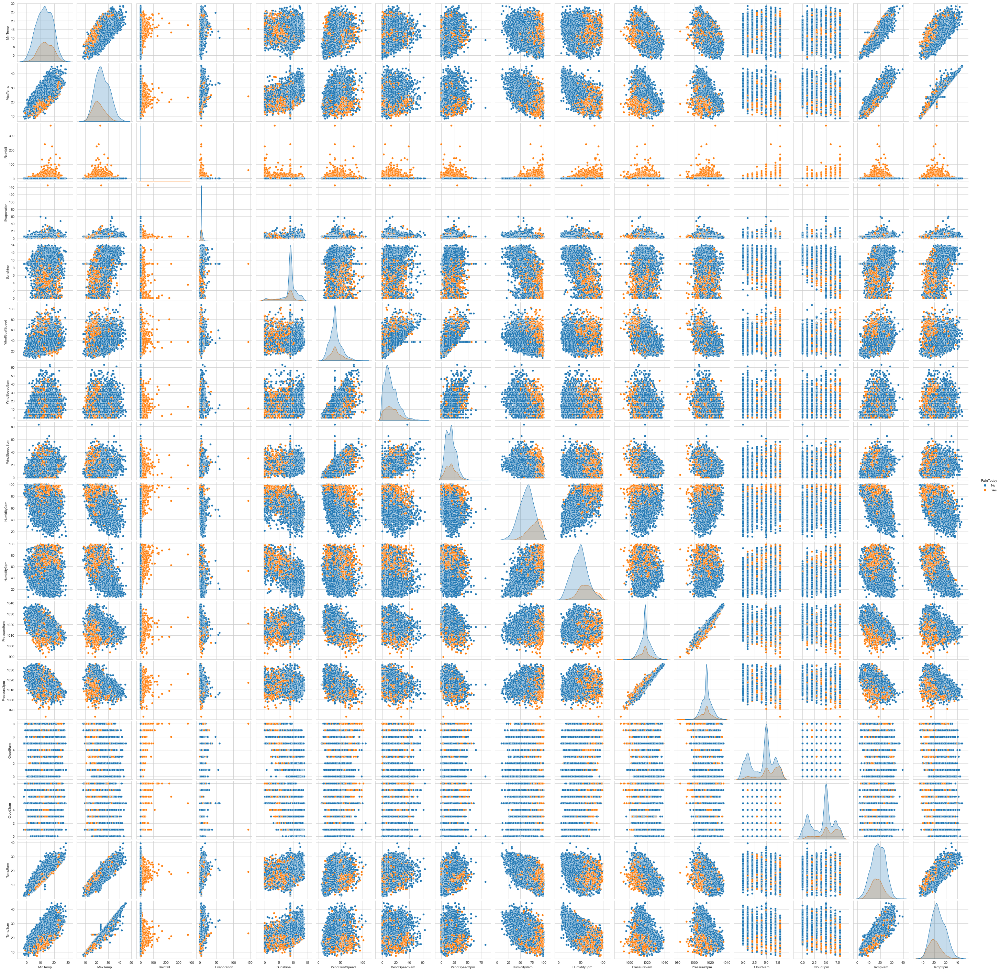

In [99]:
sns.pairplot(data=df,hue='RainToday')

# Feature Engneering:

In [100]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i,"\n",df[i].unique(),"\n***"*2)

Date 
 ['2008-12-01' '2008-12-02' '2008-12-03' ... '2013-06-06' '2013-06-07'
 '2013-06-08'] 
***
***
Location 
 ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
***
***
WindGustDir 
 ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'SSW'] 
***
***
WindDir9am 
 ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW'
 'WNW' 'NNE'] 
***
***
WindDir3pm 
 ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' 'NE'] 
***
***
RainToday 
 ['No' 'Yes'] 
***
***
RainTomorrow 
 ['No' 'Yes'] 
***
***


### Taking This under consideration

- North-Northeast Wind = The wind comes from halfway between north and northeast.
- Northeast wind = the wind comes from halfway between North and East.
- East-Northeast Wind = The wind comes from halfway between NorthEast and East.
- East wind = the wind comes from the East.
- East-SouthEast Wind = The wind comes from halfway between southeast and east

so on....

In [101]:
#WindGustDir ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE''ESE' 'SSW']
df['WindGustDir'].replace(['WNW','WSW','NNW','NNE','ENE','SSE','ESE','SSW'],['NW','SW','NW','NE','NE','SE','SE','SW'],inplace=True)

# WindDir9am ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW''WNW' 'NNE'] 
df['WindDir9am'].replace(['NNW','ENE','SSE','SSW','WSW','ESE','WNW','NNE'],['NW','NE','SE','SW','SW','SE','NW','NE'],inplace=True)

#WindDir3pm ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S''NNE' 'NE']
df['WindDir3pm'].replace(["WNW",'WSW','SSE','ESE','ENE','NNW','SSW','NNE'],['NW','SW','SE','SE','NE','NW','SW','NE'],inplace=True)

In [102]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i,"\n",df[i].unique(),"\n***"*1)

Date 
 ['2008-12-01' '2008-12-02' '2008-12-03' ... '2013-06-06' '2013-06-07'
 '2013-06-08'] 
***
Location 
 ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
***
WindGustDir 
 ['W' 'NW' 'SW' 'NE' 'N' 'E' 'SE' 'S'] 
***
WindDir9am 
 ['W' 'NW' 'SE' 'NE' 'SW' 'S' 'N' 'E'] 
***
WindDir3pm 
 ['NW' 'SW' 'E' 'W' 'SE' 'NE' 'N' 'S'] 
***
RainToday 
 ['No' 'Yes'] 
***
RainTomorrow 
 ['No' 'Yes'] 
***


In [103]:
# Average Column Generated
df['Avg_WindSpeed']=(df['WindSpeed9am']+df['WindSpeed3pm'])/2
df['Avg_Humidity']=(df['Humidity9am']+df['Humidity3pm']/2)
df['Avg_Cloud']=(df['Cloud9am']+df['Cloud3pm']/2)
df['Avg_Temp']=(df['Temp9am']+df['Temp3pm']/2)
df['Avg_Pressure']=(df['Pressure9am']+df['Pressure3pm']/2)

# Extract the Day and Month from Date column.
df['Day']= df['Date'].str.split('-').str[2]
df['Month']= df['Date'].str.split('-').str[1]
df['Year'] = df['Date'].str.split('-').str[0]

In [104]:
# Deleting Old Columns
df.drop(['WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm','Cloud9am','Cloud3pm'],axis=1,inplace=True)

In [105]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

for i in df.columns:
    if df[i].dtype=='object':
        df[i]=le.fit_transform(df[i])
df.head(2)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure,Day,Month,Year
0,0,1,13.4,22.9,0.6,4.6,9.0,7,44.0,7,3,16.9,21.8,0,0,22.0,82.0,10.5,27.80,1511.25,0,11,0
1,1,1,7.4,25.1,0.0,4.6,9.0,3,44.0,3,6,17.2,24.3,0,0,13.0,56.5,7.5,29.35,1514.50,1,11,0


# Checking Relationship with Variables

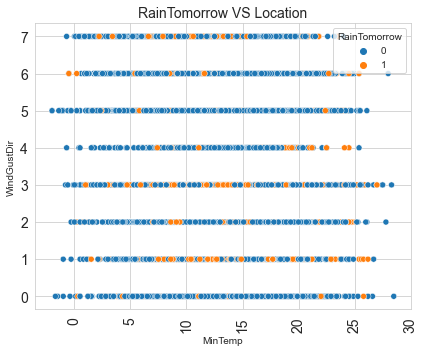

In [106]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='MinTemp',hue='RainTomorrow',y='WindGustDir',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Location",fontsize=14)
plt.tight_layout()

Probability of Rain with Location with Heat

<Figure size 576x432 with 0 Axes>

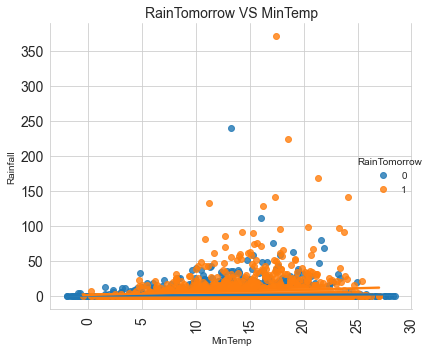

In [107]:
plt.figure(figsize=(8,6))
sns.lmplot(x='MinTemp',hue='RainTomorrow',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS MinTemp",fontsize=14)
plt.tight_layout()

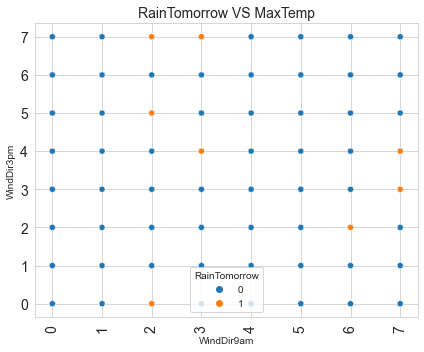

In [108]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='WindDir9am',hue='RainTomorrow',y='WindDir3pm',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS MaxTemp",fontsize=14)
plt.tight_layout()

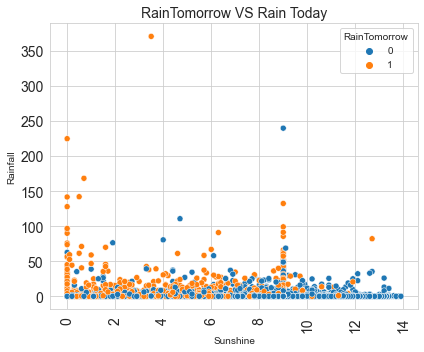

In [109]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Sunshine',hue='RainTomorrow',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

# Descriptive Statistics

In [110]:
df.describe()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure,Day,Month,Year
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,1279.871636,5.323721,13.110086,24.093301,2.723410,4.99898,8.421665,3.218279,38.702159,3.383614,3.916001,17.895830,22.700281,0.232476,0.232476,15.164153,92.740757,6.775806,29.245970,1525.179252,14.737208,5.462141,4.052203
std,795.301286,3.099455,5.540674,6.130367,10.490138,3.36177,2.789228,2.360807,13.393977,2.103128,1.928169,5.722418,5.972262,0.422442,0.422442,8.516389,24.167082,3.332466,8.377505,8.937731,8.793898,3.377471,2.301057
min,0.000000,0.000000,-2.000000,8.200000,0.000000,0.00000,0.000000,0.000000,7.000000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000,0.000000,13.500000,0.000000,5.850000,1481.250000,0.000000,0.000000,0.000000
25%,622.000000,2.250000,9.000000,19.600000,0.000000,4.00000,8.800000,1.000000,30.000000,1.000000,2.000000,13.900000,18.400000,0.000000,0.000000,9.000000,76.500000,4.500000,23.200000,1520.112500,7.000000,3.000000,2.000000
50%,1160.000000,6.000000,13.200000,23.500000,0.000000,4.60000,9.000000,3.000000,37.000000,3.000000,4.000000,18.000000,22.100000,0.000000,0.000000,14.000000,93.500000,7.500000,29.050000,1525.150000,15.000000,5.000000,4.000000
75%,1955.000000,8.000000,17.400000,28.400000,0.800000,5.00000,9.200000,5.000000,46.000000,5.000000,5.000000,22.200000,26.800000,0.000000,0.000000,20.500000,110.000000,9.000000,35.400000,1530.050000,22.000000,8.000000,6.000000
max,3003.000000,11.000000,28.500000,45.500000,371.000000,145.00000,13.900000,7.000000,107.000000,7.000000,7.000000,39.400000,44.100000,1.000000,1.000000,60.000000,148.500000,12.000000,56.750000,1556.800000,30.000000,11.000000,9.000000


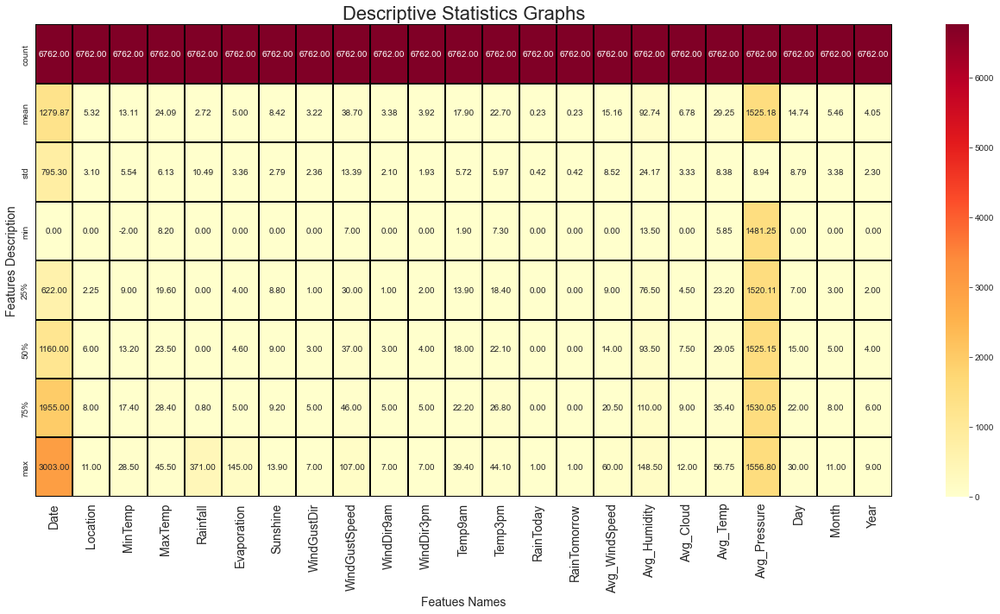

In [111]:
plt.figure(figsize=(18,10))
sns.heatmap(df.describe(),annot=True,linewidth=0.02,linecolor='black',fmt='0.2f',cmap='YlOrRd')
plt.title("Descriptive Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features Description',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.tight_layout()

Few Observation :
----------------------------

- Null Values: No Null Values
- Right Skewed: Nill
- Left Skewed: Nill
- Standard Deviation is more: WindGustSpeed, Rainfall, Humidity9am, Humidity3pm
- Maximum Outliers: Evaporation,Rainfall,WindGustSpeed,WindSpeed9am

# Correlation Graph

In [112]:
df.corr()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure,Day,Month,Year
Date,1.000000,0.493263,0.005965,0.061946,-0.010375,0.115569,0.133728,-0.190042,-0.038983,-0.133655,0.057424,0.027650,0.071332,-0.015663,-0.015222,-0.097907,0.033515,0.003850,0.044313,0.029363,0.006301,0.035911,0.992331
Location,0.493263,1.000000,0.090455,0.070761,-0.004972,0.134965,0.068411,-0.092473,0.254955,-0.142647,0.038110,0.098576,0.066010,-0.004280,-0.004506,0.266564,-0.024480,-0.020330,0.090863,-0.033843,-0.000710,-0.067376,0.503047
MinTemp,0.005965,0.090455,1.000000,0.728059,0.090971,0.284696,0.001976,-0.092517,0.242823,0.053516,-0.087809,0.891417,0.696861,0.075902,0.097173,0.202793,-0.083682,0.062566,0.857293,-0.444509,0.014356,-0.237204,0.032974
MaxTemp,0.061946,0.070761,0.728059,1.000000,-0.087604,0.356420,0.323262,-0.150935,0.166300,-0.103593,-0.140212,0.866654,0.974994,-0.225526,-0.160063,0.097448,-0.467044,-0.272037,0.939518,-0.365683,0.016108,-0.171616,0.081092
Rainfall,-0.010375,-0.004972,0.090971,-0.087604,1.000000,-0.003746,-0.190464,0.026206,0.086519,0.088440,0.044450,-0.004365,-0.091795,0.461817,0.223599,0.040303,0.255070,0.191220,-0.035702,-0.058842,-0.007989,-0.015187,-0.008516
Evaporation,0.115569,0.134965,0.284696,0.356420,-0.003746,1.000000,0.251882,-0.060756,0.177502,-0.040372,-0.019005,0.337970,0.347958,-0.113699,-0.077340,0.172591,-0.266572,-0.117487,0.354885,-0.209156,0.011120,-0.002998,0.114748
Sunshine,0.133728,0.068411,0.001976,0.323262,-0.190464,0.251882,1.000000,-0.094539,-0.020876,-0.056948,-0.017840,0.185468,0.344193,-0.249807,-0.337550,-0.030267,-0.396541,-0.546587,0.249374,-0.014290,0.000706,-0.005828,0.134089
WindGustDir,-0.190042,-0.092473,-0.092517,-0.150935,0.026206,-0.060756,-0.094539,1.000000,-0.025850,0.367536,0.354135,-0.107350,-0.158052,0.098456,0.024747,0.078540,0.009747,0.099038,-0.129665,-0.015823,0.009254,-0.000577,-0.190155
WindGustSpeed,-0.038983,0.254955,0.242823,0.166300,0.086519,0.177502,-0.020876,-0.025850,1.000000,-0.083593,-0.004182,0.222317,0.130483,0.085641,0.184400,0.699062,-0.233445,0.018668,0.198368,-0.386215,-0.002539,0.048189,-0.043982
WindDir9am,-0.133655,-0.142647,0.053516,-0.103593,0.088440,-0.040372,-0.056948,0.367536,-0.083593,1.000000,0.193124,0.010732,-0.105783,0.135672,0.012479,0.045643,-0.009162,0.043686,-0.030376,0.015109,-0.024866,-0.014009,-0.132595


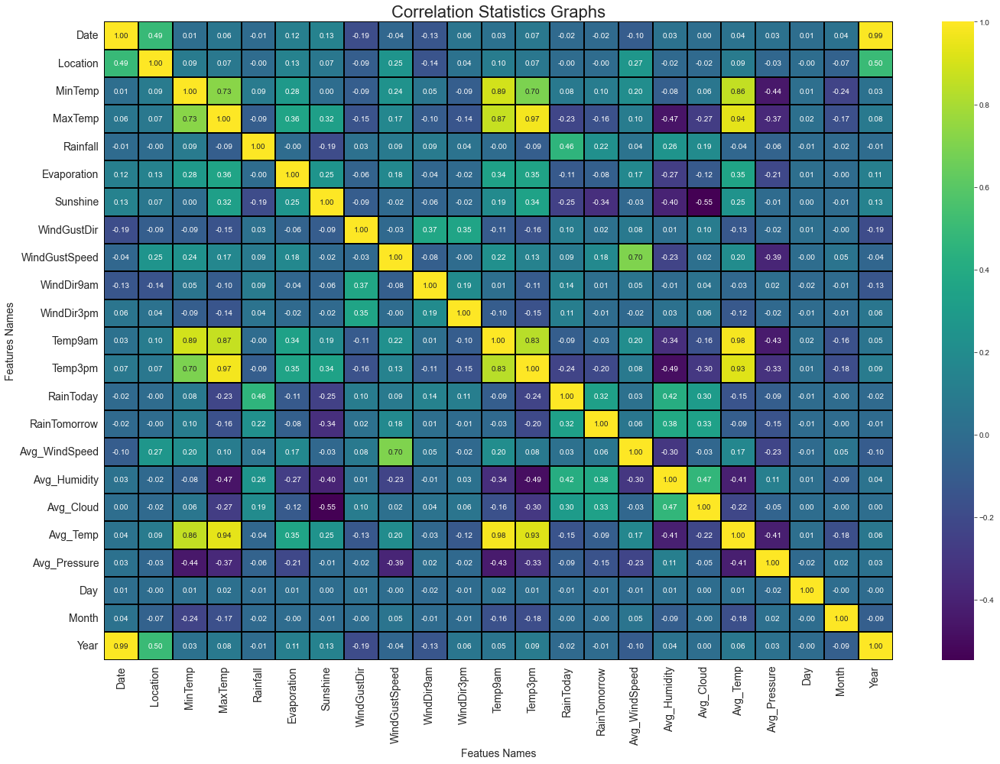

In [113]:
plt.figure(figsize=(20,14))
sns.heatmap(df.corr(),annot=True,linewidth=0.02,linecolor='black',fmt='0.2f',cmap='viridis')
plt.title("Correlation Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features Names',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

# Correlation For " Model Linear Regression"

In [114]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.190464
Temp3pm         -0.091795
MaxTemp         -0.087604
Avg_Pressure    -0.058842
Avg_Temp        -0.035702
Month           -0.015187
Date            -0.010375
Year            -0.008516
Day             -0.007989
Location        -0.004972
Temp9am         -0.004365
Evaporation     -0.003746
WindGustDir      0.026206
Avg_WindSpeed    0.040303
WindDir3pm       0.044450
WindGustSpeed    0.086519
WindDir9am       0.088440
MinTemp          0.090971
Avg_Cloud        0.191220
RainTomorrow     0.223599
Avg_Humidity     0.255070
RainToday        0.461817
Rainfall         1.000000
Name: Rainfall, dtype: float64

## Graph

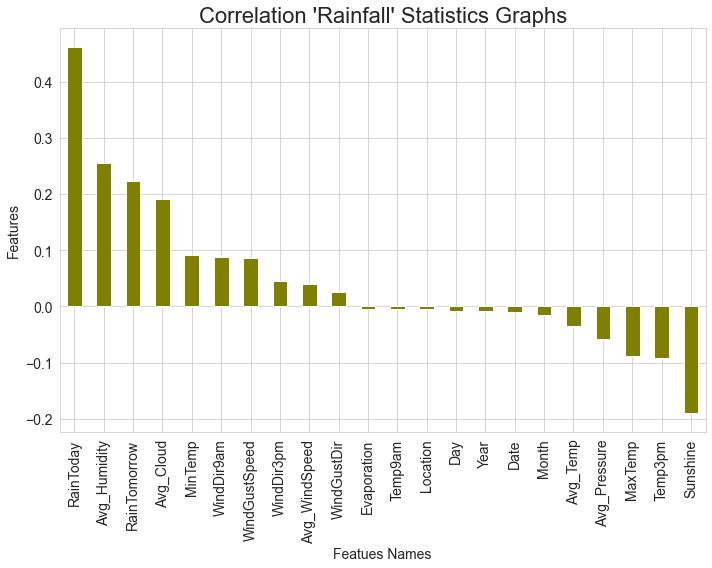

In [335]:
plt.figure(figsize=(10,8))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='olive')
plt.title("Correlation 'Rainfall' Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observation

- Sunshine is 19 percentage Negatively Correlated with the Target Variable.
- Temp3pm  is 9 percentage Negatively Correlated with the Target Variable.
- MaxTemp  is 9 percentage Negatively Correlated with the Target Variable.
- Pressure9am is 7 percentage Negatively Correlated with the Target Variable.
- Pressure3pm  is 3 percentage Negatively Correlated with the Target Variable.
- Location is 1 percentage Negatively Correlated with the Target Variable.
- Temp9am  is 0 percentage Negatively Correlated with the Target Variable.
- Evaporation  is 0 percentage Negatively Correlated with the Target Variable.
- WindSpeed3pm is 2 percentage Positively COrrelated with the target Variable.
- WindGustDir is 3 percentage Positively Correlated with the Target Variable.
- WindDir3pm is 5 percentage Positively Correlated with the Target Variable.
- WindSpeed9am is 5 percentage Positively Correlated with the Target Variable.
- WindGustSpeed is 9 percentage Positively Correlated with the Target Variable.
- WindDir9am is 9 percentage Positively Correlated with the Target Variable.
- MinTemp is 9 percentage Positively Correlated with the Target Variable.  
- Cloud3pm is 15 percentage Positively Correlated with the Target Variable.
- Cloud9am is 18 percentage Positively Correlated with the Target Variable.
- RainTomorrow is 22 percentage Positively Correlated with the Target Variable.
- Humidity9am is 23 percentage Positively Correlated with the Target Variable.
- Humidity3pm is 24 percentage Positively Correlated with the Target Variable.
- RainToday is 46 percentage Positively Correlated with the Target Variable.

# Checking Outliers

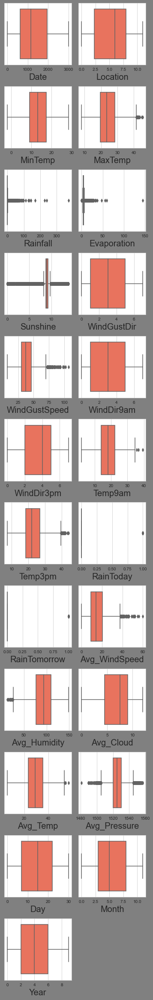

In [116]:
plt.figure(figsize=(5,40),facecolor='grey',edgecolor='black',)

plotnumber=1

for column in df:
    if plotnumber<=30 : 
        sns.set_style('whitegrid')
        ax=plt.subplot(15,2,plotnumber)
        sns.boxplot(df[column],color='Tomato')
        plt.xlabel(column , fontsize=20)
        
    plotnumber+=1
plt.tight_layout()

### Observation
- Minimum Outliers: MaxTemp,WindGustSpeed,Temp9am,Temp3pm, RainToday
- Maximum Outliers: Evaporation,Sunshine,Avg Pressure

- Target Variable:[Rainfall,Rain Tomorrow]

# Skewness:

In [117]:
df.skew().sort_values()

Sunshine         -1.378286
Avg_Cloud        -0.471031
WindDir3pm       -0.335250
Avg_Humidity     -0.226418
MinTemp          -0.084215
Temp9am          -0.047627
WindGustDir      -0.005012
Location         -0.000009
Day               0.006240
Month             0.021988
Avg_Pressure      0.051579
Avg_Temp          0.061349
WindDir9am        0.118686
Date              0.324136
MaxTemp           0.330020
Temp3pm           0.352174
Year              0.354481
Avg_WindSpeed     0.652130
WindGustSpeed     0.838665
RainTomorrow      1.266937
RainToday         1.266937
Evaporation      13.603792
Rainfall         13.637400
dtype: float64

Skewness Threshold is taken is(+/-65).
--------------------------------------------

Outcome shows, Column showing skewness are..

- Sunshine         -01.378286
- WindGustSpeed     00.838665
- RainToday         01.266937
- RainTomorrow      01.266937
- Evaporation       13.603792
- Rainfall          13.637400

<AxesSubplot:xlabel='Sunshine', ylabel='Density'>

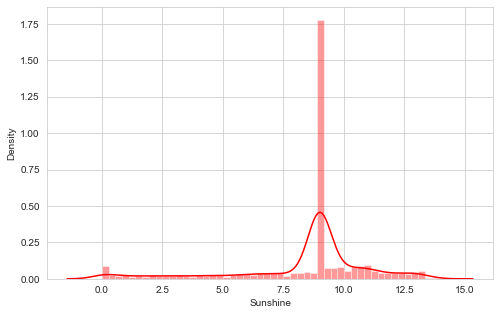

In [118]:
plt.figure(figsize=(8,5))
sns.distplot(df['Sunshine'],color='r',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-Modal)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

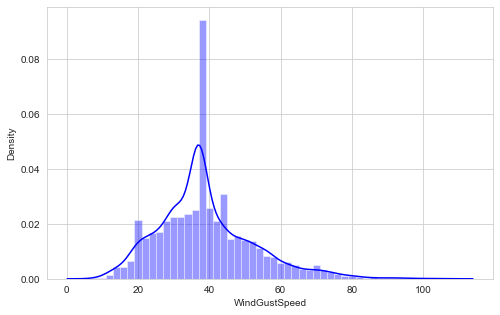

In [119]:
plt.figure(figsize=(8,5))
sns.distplot(df['WindGustSpeed'],color='blue',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='RainToday', ylabel='Density'>

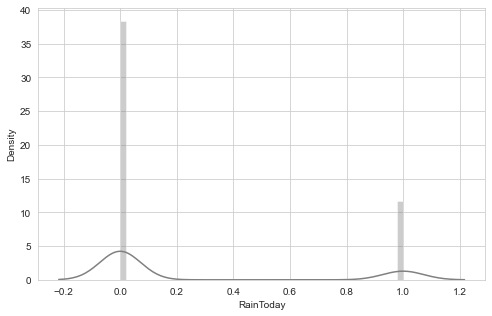

In [120]:
plt.figure(figsize=(8,5))
sns.distplot(df['RainToday'],color='grey',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bimodal)

<AxesSubplot:xlabel='RainTomorrow', ylabel='Density'>

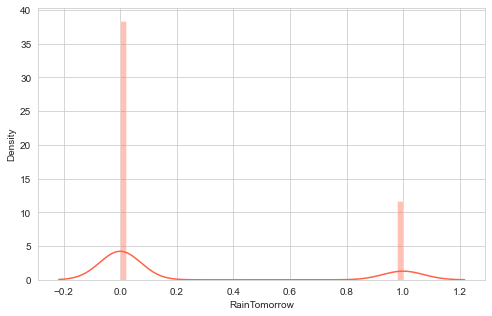

In [121]:
plt.figure(figsize=(8,5))
sns.distplot(df['RainTomorrow'],color='Tomato',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-modal)

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

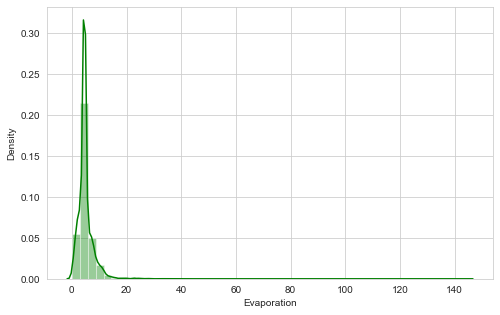

In [122]:
plt.figure(figsize=(8,5))
sns.distplot(df['Evaporation'],color='green',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

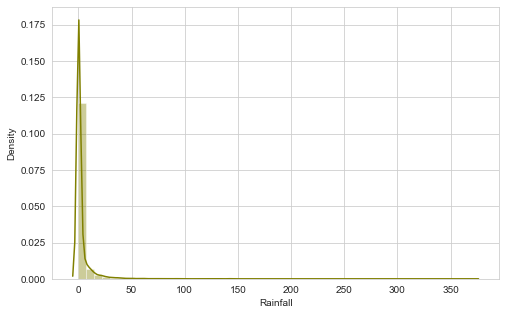

In [123]:
plt.figure(figsize=(8,5))
sns.distplot(df['Rainfall'],color='olive',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

#### Note: "Rainfall" is target Variable

# DATA CLEANSING: LINEAR REGRESSION

In [124]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.190464
Temp3pm         -0.091795
MaxTemp         -0.087604
Avg_Pressure    -0.058842
Avg_Temp        -0.035702
Month           -0.015187
Date            -0.010375
Year            -0.008516
Day             -0.007989
Location        -0.004972
Temp9am         -0.004365
Evaporation     -0.003746
WindGustDir      0.026206
Avg_WindSpeed    0.040303
WindDir3pm       0.044450
WindGustSpeed    0.086519
WindDir9am       0.088440
MinTemp          0.090971
Avg_Cloud        0.191220
RainTomorrow     0.223599
Avg_Humidity     0.255070
RainToday        0.461817
Rainfall         1.000000
Name: Rainfall, dtype: float64

### I would delete these columns as:

- Sunshine is very negatively correlated with target variable.
- Year            -0.008516
- Day             -0.007989
- Location        -0.004972
- Temp9am         -0.004365
- Evaporation     -0.003746


In [125]:
delete=pd.DataFrame(data={"Column_Name":['Sunshine','Location','Temp9am','Evaporation'],
                         "Values":[-0.190464,0.004972,-0.004365,-0.003746],
                         "Outliers":['Yes','No','yes','yes',],
                         "Normalised":['Yes','No','NO','No']})
delete

,Column_Name,Values,Outliers,Normalised
0,Sunshine,-0.190464,Yes,Yes
1,Location,0.004972,No,No
2,Temp9am,-0.004365,yes,NO
3,Evaporation,-0.003746,yes,No


In [126]:
df.drop(['Sunshine','Location','Temp9am','Evaporation'],axis=1,inplace=True)

# Zscore

In [127]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z.head(3)

,Date,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Temp3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure,Day,Month,Year
0,1.609411,0.052329,0.194668,0.202435,1.601995,0.395568,1.719654,0.475098,0.150755,0.550355,0.550355,0.802729,0.444470,1.117632,0.172614,1.558593,1.675969,1.639768,1.761148
1,1.608153,1.030652,0.164227,0.259635,0.092466,0.395568,0.182415,1.080897,0.267878,0.550355,0.550355,0.254135,1.499703,0.217331,0.012419,1.194939,1.562245,1.639768,1.761148
2,1.606896,0.037920,0.262108,0.259635,1.178380,0.544900,1.719654,1.080897,0.083680,0.550355,0.550355,0.861444,1.644538,0.232820,0.400391,1.480267,1.448521,1.639768,1.761148


In [128]:
np.where(z>3)

(array([   8,   12,   44,   44,   52,   60,   60,   61,   61,   62,   62,
          62,   67,   68,   68,  123,  267,  381,  405,  406,  407,  431,
         462,  466,  563,  568,  569,  602,  683,  699,  713,  748,  770,
         795,  796,  797,  802,  928,  935,  949,  979,  980,  980,  980,
        1008, 1009, 1011, 1138, 1148, 1149, 1151, 1202, 1203, 1237, 1241,
        1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480, 1481, 1513, 1661,
        1673, 1680, 1774, 1819, 1873, 1898, 1903, 2108, 2116, 2201, 2219,
        2231, 2265, 2281, 2429, 2488, 2500, 2505, 2527, 2527, 2541, 2593,
        2676, 2677, 2735, 2849, 2859, 2890, 2898, 2900, 2900, 2901, 2909,
        3003, 3042, 3051, 3052, 3055, 3058, 3059, 3060, 3066, 3067, 3067,
        3068, 3070, 3082, 3082, 3089, 3089, 3099, 3099, 3101, 3153, 3157,
        3169, 3212, 3234, 3248, 3278, 3291, 3302, 3302, 3303, 3350, 3360,
        3419, 3421, 3430, 3449, 3449, 3449, 3450, 3450, 3458, 3491, 3509,
        3514, 3571, 3602, 3603, 3607, 

In [129]:
z.iloc[8,5]

3.0835422168793576

In [130]:
new_df=df[(z<3).all(axis=1)]

In [131]:
new_df.head()

,Date,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Temp3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure,Day,Month,Year
0,0,13.4,22.9,0.6,7,44.0,7,3,21.8,0,0,22.0,82.0,10.5,27.80,1511.25,0,11,0
1,1,7.4,25.1,0.0,3,44.0,3,6,24.3,0,0,13.0,56.5,7.5,29.35,1514.50,1,11,0
2,2,12.9,25.7,0.0,6,46.0,7,6,23.2,0,0,22.5,53.0,6.0,32.60,1511.95,2,11,0
3,3,9.2,28.0,0.0,2,24.0,5,0,26.5,0,0,10.0,53.0,7.5,31.35,1524.00,3,11,0
4,4,17.5,32.3,1.0,7,41.0,2,3,29.7,0,0,13.5,98.5,11.0,32.65,1513.80,4,11,0


# Data Loss Percentage

In [132]:
print("Old Data Frame ",df.shape[0])
print("New_Data Frame ",new_df.shape[0])
print("Data Loss Percentage ",((df.shape[0]-new_df.shape[0])/df.shape[0])*100)

Old Data Frame  6762
New_Data Frame  6513
Data Loss Percentage  3.6823425022182783


### However Data Loss percentage is not more than 5 percentage so we will procced with the data set

# Train and Test Seperation:

In [283]:
# y variable
y=new_df.iloc[:,3] 

# x variable
x=new_df.drop(['Rainfall'],axis=1)
x.head(4)

,Date,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Temp3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure,Day,Month,Year
0,0,13.4,22.9,7,44.0,7,3,21.8,0,0,22.0,82.0,10.5,27.80,1511.25,0,11,0
1,1,7.4,25.1,3,44.0,3,6,24.3,0,0,13.0,56.5,7.5,29.35,1514.50,1,11,0
2,2,12.9,25.7,6,46.0,7,6,23.2,0,0,22.5,53.0,6.0,32.60,1511.95,2,11,0
3,3,9.2,28.0,2,24.0,5,0,26.5,0,0,10.0,53.0,7.5,31.35,1524.00,3,11,0


In [284]:
y.head(4)

0    0.6
1    0.0
2    0.0
3    0.0
Name: Rainfall, dtype: float64

In [285]:
print("Present Size of X Data ",x.shape,"And present Size of Y Data ",y.shape)

Present Size of X Data  (6513, 18) And present Size of Y Data  (6513,)


In [286]:
x.columns

Index(['Date', 'MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed',
       'WindDir9am', 'WindDir3pm', 'Temp3pm', 'RainToday', 'RainTomorrow',
       'Avg_WindSpeed', 'Avg_Humidity', 'Avg_Cloud', 'Avg_Temp',
       'Avg_Pressure', 'Day', 'Month', 'Year'],
      dtype='object')

# Removing Skewness

In [287]:
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()

x=pt.fit_transform(x)

In [288]:
x=pd.DataFrame(data=x,columns=['Date', 'MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed',
       'WindDir9am', 'WindDir3pm', 'Temp3pm', 'RainToday', 'RainTomorrow',
       'Avg_WindSpeed', 'Avg_Humidity', 'Avg_Cloud', 'Avg_Temp',
       'Avg_Pressure', 'Day', 'Month', 'Year'])

In [289]:
x.skew()

Date            -0.178013
MinTemp         -0.114197
MaxTemp         -0.017702
WindGustDir     -0.228499
WindGustSpeed    0.006947
WindDir9am      -0.129821
WindDir3pm      -0.235413
Temp3pm         -0.015738
RainToday        1.343398
RainTomorrow     1.330571
Avg_WindSpeed   -0.067576
Avg_Humidity    -0.063026
Avg_Cloud       -0.312370
Avg_Temp        -0.049351
Avg_Pressure     0.000000
Day             -0.248712
Month           -0.200765
Year            -0.067531
dtype: float64

In [290]:
x.drop(['RainToday','RainTomorrow'],inplace=True,axis=1)

# Standard Scaler(Standardization)

In [291]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

x=scaler.fit_transform(x)

In [292]:
x

array([[-2.4262407 ,  0.07055162, -0.13550803, ..., -1.93629966,
         1.52416731, -2.38779978],
       [-2.40575255, -1.01667689,  0.22718815, ..., -1.72814129,
         1.52416731, -2.38779978],
       [-2.38935433, -0.01943202,  0.32340953, ..., -1.54822161,
         1.52416731, -2.38779978],
       ...,
       [ 1.80633922, -1.38372071,  0.51264351, ...,  0.8324465 ,
        -0.05769763,  1.82504323],
       [ 1.80716322, -0.94360537,  0.52822655, ...,  0.9289947 ,
        -0.05769763,  1.82504323],
       [ 1.80798711,  0.33995254, -0.03498224, ...,  1.02443562,
        -0.05769763,  1.82504323]])

In [293]:
print("Mean ",round(x.mean()))
print("Standard Deviation ",round(x.std()))

Mean  0
Standard Deviation  1


In [294]:
x=pd.DataFrame(data=x,columns=['Date', 'MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed',
       'WindDir9am', 'WindDir3pm', 'Temp3pm',
       'Avg_WindSpeed', 'Avg_Humidity', 'Avg_Cloud', 'Avg_Temp',
       'Avg_Pressure', 'Day', 'Month', 'Year'])

# Checking Multicolinarity

In [295]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(x):
    vif=pd.DataFrame()
    vif['Variable']=x.columns
    vif['VIF Factors']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return vif
calc_vif(x)

,Variable,VIF Factors
0,Date,211.704294
1,MinTemp,8.372382
2,MaxTemp,25.993854
3,WindGustDir,1.389147
4,WindGustSpeed,2.190567
5,WindDir9am,1.258322
6,WindDir3pm,1.199186
7,Temp3pm,24.686314
8,Avg_WindSpeed,2.221151
9,Avg_Humidity,2.321056


In [296]:
x.drop(['Year','MaxTemp'],axis=1,inplace=True)
calc_vif(x)

,Variable,VIF Factors
0,Date,1.111016
1,MinTemp,8.325341
2,WindGustDir,1.387914
3,WindGustSpeed,2.164022
4,WindDir9am,1.254234
5,WindDir3pm,1.198683
6,Temp3pm,11.031982
7,Avg_WindSpeed,2.198324
8,Avg_Humidity,2.318269
9,Avg_Cloud,1.494639


In [297]:
x.skew()

Date            -0.178013
MinTemp         -0.114197
WindGustDir     -0.228499
WindGustSpeed    0.006947
WindDir9am      -0.129821
WindDir3pm      -0.235413
Temp3pm         -0.015738
Avg_WindSpeed   -0.067576
Avg_Humidity    -0.063026
Avg_Cloud       -0.312370
Avg_Temp        -0.049351
Avg_Pressure    -0.008050
Day             -0.248712
Month           -0.200765
dtype: float64

## PCA

from sklearn.decomposition import PCA
pca=PCA(n_components=8)

x=pca.fit_transform(x)

- PCA is not working Well

# Target Variable

In [266]:
y.unique()

array([ 0.6,  0. ,  1. ,  0.2,  1.4,  2.2,  3.6, 16.8, 10.6,  1.2,  0.8,
        6.4,  0.4,  3. ,  5.8, 11.6,  1.8, 12.6,  8.4,  6.2, 20. , 21. ,
        3.2,  4.8,  4.2,  8. , 14.4,  4.6,  2. ,  5.6,  1.6,  6. ,  4.4,
        5.4,  5. ,  7.8,  6.8,  9.8,  3.8,  2.4,  5.2,  6.6, 13.4, 10.2,
       28.8,  7. , 25.8,  9.4, 12.4,  8.6, 20.6, 11. , 17. , 10.4, 28. ,
       21.4, 18.6,  7.2,  8.2, 10.8, 15.4,  9.6,  4. , 21.8, 20.8, 24.8,
       10. , 11.4, 19. , 32.8,  3.4, 19.2, 18.8, 14.8, 12. , 18.4, 25.6,
       14.2, 13.8, 28.2, 12.2, 12.8, 11.8, 19.8, 17.4,  8.8,  2.6, 24.4,
        7.4, 15.6,  9.2, 21.2, 11.2, 29.8, 20.2, 19.6,  2.8, 13.6, 15.2,
        9. , 29.4, 13.2, 24. , 18.2, 33.4,  7.6, 16.2, 13. , 23.8, 27.6,
       15.8, 30.8, 14.6, 20.4, 15. , 23. , 31.1, 27.8, 15.7,  0.5,  0.1,
       26. , 22.5, 33.8, 17.2, 22.8,  0.7,  1.5, 31.4, 32.4,  6.3, 17.6,
       30. , 27.2, 23.4, 16.4, 26.4, 25. , 30.2, 25.2,  8.7,  2.1,  1.9,
        5.5,  2.3,  2.5,  2.9, 28.4, 16. , 33. , 19

### Continious Values we will use Linear Model

# Linear Regression

In [298]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

In [299]:
for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.2)
    lr.fit(x_train,y_train)
    
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    
    if round(r2_score(y_train,pred_train),2)==round(r2_score(y_test,pred_test),3):
        print(f"At random State {i},The r2 train score {r2_score(y_train,pred_train)}, r2 test score {r2_score(y_test,pred_test)}")

At random State 10,The r2 train score 0.1760488493359983, r2 test score 0.1796302708429488
At random State 70,The r2 train score 0.17588553143355068, r2 test score 0.1795614909367944


In [300]:
# Train Test
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=83,test_size=0.2)

#training 
lr.fit(x_train,y_train)
lr_score=lr.score(x_train,y_train)

#predict
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train)*100,"Testing Accuracy R2_score ",r2_score(y_test,pred_test)*100)
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  17.755343780667754 Testing Accuracy R2_score  17.417583751000233
Training Mean_squared_Error  18.378541255590903 Testing Mean_squared_error  18.8874620880611
Training Absolute_Error  2.514794226867574 Testing Absolute Error 2.5609623403973156


In [301]:
print("Coefficient ",lr.coef_," Intercept ",lr.intercept_)

Coefficient  [ 0.08427958  0.74688924  0.08650336  0.57379142  0.50211361  0.29053064
  0.05914816  0.14338292  1.60497612  0.14707264 -0.56186186 -0.28275321
 -0.01684813  0.20054988]  Intercept  1.8163993971919958


# Model Cross Validation

In [302]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    lr_cv_score=cross_val_score(lr,x,y,cv=i)
    cv_mean=lr_cv_score.mean()

    print(f"At CROSS_FOLD {i}, Cross_Val_Mean {cv_mean} ,Training Score is {train_accuracy}, Testing Score {test_accuracy}")

At CROSS_FOLD 2, Cross_Val_Mean 0.14149688448761372 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 3, Cross_Val_Mean 0.14951797421377352 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 4, Cross_Val_Mean 0.148373288115591 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 5, Cross_Val_Mean 0.15873045161142485 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 6, Cross_Val_Mean 0.15050267052783864 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 7, Cross_Val_Mean 0.16243334377132296 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 8, Cross_Val_Mean 0.16071895306660655 ,Training Score is 0.17755343780667754, Testing Score 0.17417583751000232
At CROSS_FOLD 9, Cross_Val_Mean 0.15958875065650682 ,Training Score is 0.17755343780667754, Testing Score 0.174175837510

#### Selected Cross Fold 8 is close cvscore is close Testing Score

In [303]:
# pred training for linear regression
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with linear regression
lr_cv_score=cross_val_score(lr,x,y,cv=8) 
lr_mean=lr_cv_score.mean() #mean value

print("Cv_score of Model is ",lr_mean,"The Training Score is ", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.16071895306660655 The Training Score is  0.17755343780667754 Testing Score Stands  0.17417583751000232


### Linear Regression Graph Model

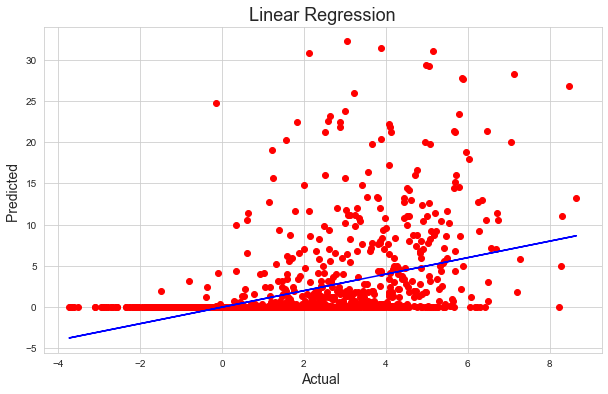

In [304]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='r')
plt.plot(pred_test,pred_test,color='b')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Regularization

In [305]:
from sklearn.linear_model import ElasticNet
# Elastic Net Model
en=ElasticNet()
en.fit(x_train,y_train)

# training score
en_score_training=en.score(x_train,y_train)
en_score_training*100

8.909810036319799

In [306]:
pred_en=en.predict(x_test) # predict test

en_cv_score=cross_val_score(en,x,y,cv=5)
en_cv_mean=en_cv_score.mean()
en_cv_mean*100

8.712050765187932

#### Working With Other Models
# Model- Decision Tree Regressor

In [307]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()

#training Dtc model
dtr.fit(x_train,y_train)
dtr_score=dtr.score(x_train,y_train)

#predict dtc
pred_train=dtr.predict(x_train)
pred_test=dtr.predict(x_test)

#result dtc
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  1.0 Testing Accuracy R2_score  -0.8022348136801567
Training Mean_squared_Error  3.548738477181855e-35 Testing Mean_squared_error  41.218994627782045
Training Absolute_Error  3.196419456694309e-19 Testing Absolute Error 2.84735226400614


## Cross Validation_Model

In [308]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    dtr_cv_score=cross_val_score(dtr,x,y,cv=i)
    cv_mean=dtr_cv_score.mean()

    print(f"At CROSS_FOLD{i}, Cross_Val_Score {cv_mean} Training Score{train_accuracy} Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score -0.9474223080371778 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD3, Cross_Val_Score -0.947325023908714 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD4, Cross_Val_Score -1.0813786623773658 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD5, Cross_Val_Score -0.9771220996005117 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD6, Cross_Val_Score -0.8883801912218344 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD7, Cross_Val_Score -0.8132485343640331 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD8, Cross_Val_Score -0.7765226262599362 Training Score1.0 Testing Score-0.8022348136801567
At CROSS_FOLD9, Cross_Val_Score -0.8163318361748438 Training Score1.0 Testing Score-0.8022348136801567


### Selected Cross Fold 2 is close cv_score is close Testing Score

In [309]:
#cross val with dtc
dtr_cv_score=cross_val_score(dtr,x,y,cv=2) 
dtr_mean=dtr_cv_score.mean() #mean value

print("CV_score",dtr_mean,"Training Score is ", train_accuracy," Testing Score Stands " ,test_accuracy)

CV_score -0.9470037238756922 Training Score is  1.0  Testing Score Stands  -0.8022348136801567


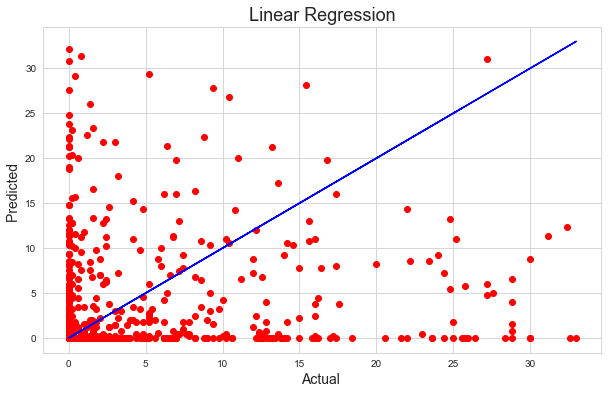

In [310]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='r')
plt.plot(pred_test,pred_test,color='b')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# KNeighbors Regressor

In [311]:
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor()

#training knr model
knr.fit(x_train,y_train)
knr_score=knr.score(x_train,y_train)

#predict knr
pred_train=knr.predict(x_train)
pred_test=knr.predict(x_test)

#result knr
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.39998836628146917 Testing Accuracy R2_score  0.17159728744994818
Training Mean_squared_Error  13.407969673704415 Testing Mean_squared_error  18.946436224098235
Training Absolute_Error  1.7608253358925148 Testing Absolute Error 2.067475057559478


## Cross Validation_Model

In [312]:
#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    knr_cv_score=cross_val_score(knr,x,y,cv=i)
    cv_mean=knr_cv_score.mean()

    print(f"At CROSS_FOLD {i},The Cross_Val_Mean {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD 2,The Cross_Val_Mean 0.0674369415542525 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 3,The Cross_Val_Mean 0.03188630822727201 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 4,The Cross_Val_Mean 0.05343903770238792 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 5,The Cross_Val_Mean 0.07488193383044543 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 6,The Cross_Val_Mean 0.061249303137300405 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 7,The Cross_Val_Mean 0.06879774996910758 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 8,The Cross_Val_Mean 0.09044121543882572 ,Training Score is 0.39998836628146917,Testing Score0.17159728744994818
At CROSS_FOLD 9,The Cross_Val_Mean 0.07214922466384373 ,Training Score is 0.39998836628146917,Testing Score0.17

### Selected Cross Fold 8 is close cv_score is close Testing Score

In [313]:
#cross val with k-Neighbors
knr_cv_score=cross_val_score(knr,x,y,cv=8) 
knr_mean=knr_cv_score.mean() #mean value

print("Cv_score of Model is ",knr_mean," The Training Score", train_accuracy," Testing Score Stands" ,test_accuracy)

Cv_score of Model is  0.09044121543882572  The Training Score 0.39998836628146917  Testing Score Stands 0.17159728744994818


### Graph

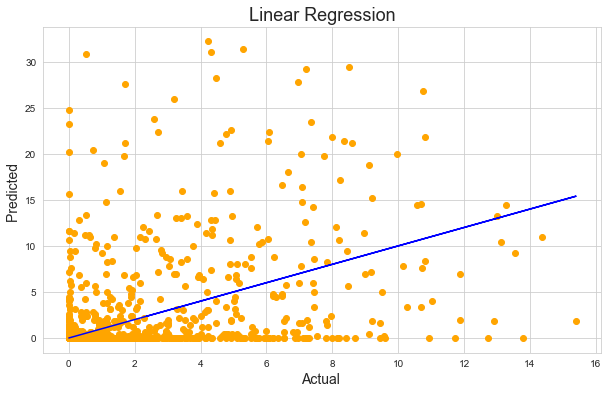

In [314]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orange')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

## Model 3 Support vector Machine

In [315]:
from sklearn.svm import SVR
svr=SVR()

#training SVR
svr.fit(x_train,y_train)
svr_score=svr.score(x_train,y_train)

#predict SVR
pred_train = svr.predict(x_train)
pred_test  = svr.predict(x_test)

#result SVR
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.0907520296886708 Testing Accuracy R2_score  0.07825174487102127
Training Mean_squared_Error  20.318221392238115 Testing Mean_squared_error  21.081346386127226
Training Absolute_Error  1.6498924157423633 Testing Absolute Error 1.7512057785482706


### Model Cross_Validation

In [316]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    svr_cv_score=cross_val_score(svr,x,y,cv=i)
    cv_mean=svr_cv_score.mean()

    print(f"CROSS_FOLD{i},Cross_Val_Score{cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy} ")

CROSS_FOLD2,Cross_Val_Score0.05098187131944726 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD3,Cross_Val_Score0.05011147260602322 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD4,Cross_Val_Score0.053155094461224045 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD5,Cross_Val_Score0.06149053969418936 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD6,Cross_Val_Score0.0649378557254346 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD7,Cross_Val_Score0.0659807310137497 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD8,Cross_Val_Score0.06257393180040073 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 
CROSS_FOLD9,Cross_Val_Score0.06491132814110408 ,Training Score is 0.0907520296886708,Testing Score0.07825174487102127 


### Selected Cross Fold 8 is close cv_score is close Testing Score

In [317]:
svr_cv_score=cross_val_score(svr,x,y,cv=8) 
svr_mean=svr_cv_score.mean() # cross val mean

print("Cv_score of Model is ",svr_mean," The Training Score is ",train_accuracy," Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.06257393180040073  The Training Score is  0.0907520296886708  Testing Score Stands  0.07825174487102127


### Model Graph

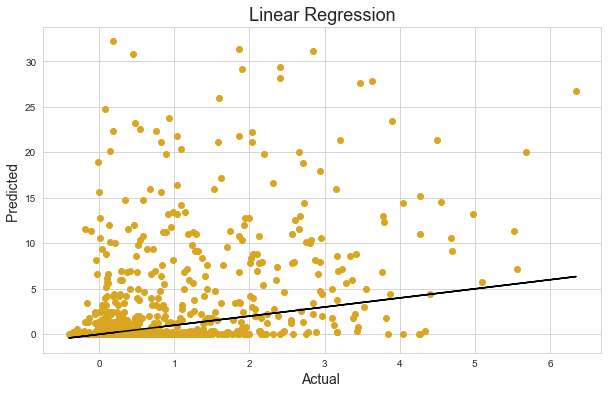

In [318]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='goldenrod')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# SGD Regressor

In [319]:
from sklearn.linear_model import SGDRegressor
sgd=SGDRegressor()

#training SGD
sgd.fit(x_train,y_train)
sgd_score=sgd.score(x_train,y_train)

#predict
pred_train=sgd.predict(x_train)
pred_test=sgd.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.17450842797865707 Testing Accuracy R2_score  0.174083678289346
Training Mean_squared_Error  18.446585601960003 Testing Mean_squared_error  18.889569865800325
Training Absolute_Error  2.5388217522287775 Testing Absolute Error 2.585961002992386


## Cross Validation_Model

In [320]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    sgd_cv_score=cross_val_score(sgd,x,y,cv=i)
    cv_mean=sgd_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.14233334914474965 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD3, The Cross_Val_Score 0.15046919528474537 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD4, The Cross_Val_Score 0.1466290388363418 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD5, The Cross_Val_Score 0.15332934575089172 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD6, The Cross_Val_Score 0.14874859093194293 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD7, The Cross_Val_Score 0.15937230433857488 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD8, The Cross_Val_Score 0.15407243015399935 ,Training Score is 0.17450842797865707,Testing Score0.174083678289346
At CROSS_FOLD9, The Cross_Val_Score 0.1535944479458108 ,Training Score is 0.17450842797865707,Testing Score0.1740836782

### Selected Cross Fold 9 is close cv_score is close Testing Score

In [321]:
# pred training for SGD Regressor
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with SGD Regressor
sgd_cv_score=cross_val_score(sgd,x,y,cv=9) 
sgd_mean=sgd_cv_score.mean() #mean value

print("Cv_score of Model is ",sgd_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.15915914547604454  The Training Score is 0.17450842797865707 Testing Score Stands  0.174083678289346


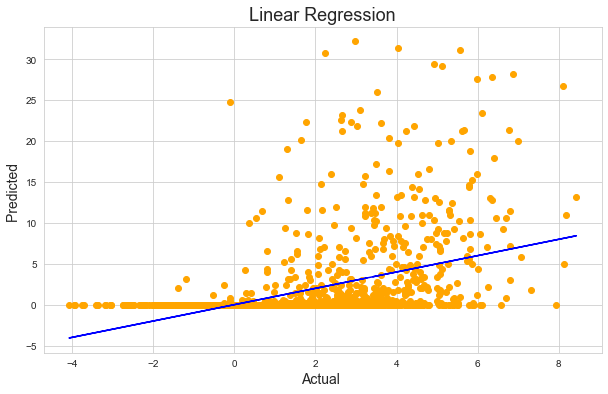

In [322]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orange')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()


# Ensemble Techniques (Bagging)

## Extra Trees Regressor

In [323]:
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()

#training score
etr.fit(x_train,y_train)
etr_score=etr.score(x_train,y_train)

#predict
pred_train=etr.predict(x_train)
pred_test=etr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  1.0 Testing Accuracy R2_score  0.23806896807928868
Training Mean_squared_Error  4.694210515042557e-29 Testing Mean_squared_error  17.426159384497314
Training Absolute_Error  2.080464186510147e-15 Testing Absolute Error 2.228033768227168


### Model Cross Validation

In [324]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    etr_cv_score=cross_val_score(etr,x,y,cv=i)
    cv_mean=etr_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.106388981578738 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD3, The Cross_Val_Score 0.10963943061592711 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD4, The Cross_Val_Score 0.12273776670461511 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD5, The Cross_Val_Score 0.14589585291320178 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD6, The Cross_Val_Score 0.13625737548139685 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD7, The Cross_Val_Score 0.1623731872940744 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD8, The Cross_Val_Score 0.17907573264735668 ,Training Score is 1.0,Testing Score0.23806896807928868
At CROSS_FOLD9, The Cross_Val_Score 0.1633958743547209 ,Training Score is 1.0,Testing Score0.23806896807928868


### As this Cross Fold 9 Cross Val Score is near to Training score.

In [325]:
# pred training for Extra Trees
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Extra Trees
etr_cv_score=cross_val_score(etr,x,y,cv=9) 
etr_mean=etr_cv_score.mean() #mean value

print("Cv_score of Model is ",etr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.17075516341727998  The Training Score is 1.0 Testing Score Stands  0.23806896807928868


### Graph Showing

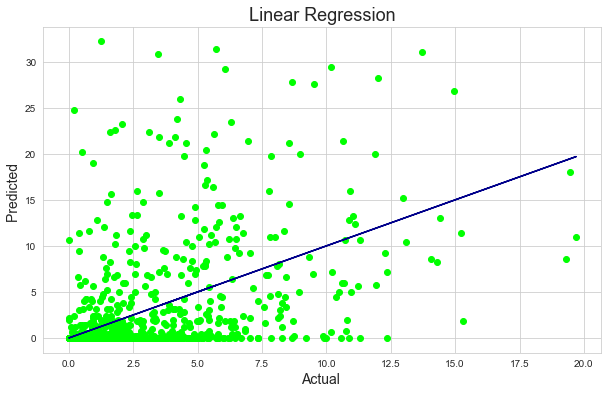

In [326]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='lime')
plt.plot(pred_test,pred_test,color='darkblue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Random Forest Regressor

In [327]:
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor()

#training Random Forest
rfr.fit(x_train,y_train)
rfr_score= rfr.score(x_train,y_train)

#predict Model
pred_train = rfr.predict(x_train)
pred_test = rfr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.8860327412060351 Testing Accuracy R2_score  0.18870173496918985
Training Mean_squared_Error  2.5467332028790786 Testing Mean_squared_error  18.555239624712204
Training Absolute_Error  0.825246641074856 Testing Absolute Error 2.2735909439754414


### Model Cross Validation

In [328]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    rfr_cv_score=cross_val_score(rfr,x,y,cv=i)
    cv_mean=rfr_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.026152888572888666 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD3, The Cross_Val_Score 0.047903881519538914 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD4, The Cross_Val_Score 0.08753939579353257 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD5, The Cross_Val_Score 0.08396801260902716 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD6, The Cross_Val_Score 0.0787564521309501 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD7, The Cross_Val_Score 0.11830239878389603 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD8, The Cross_Val_Score 0.12223964781022081 ,Training Score is 0.8860327412060351,Testing Score0.18870173496918985
At CROSS_FOLD9, The Cross_Val_Score 0.10282198134202658 ,Training Score is 0.8860327412060351,Testing Score0.1

### Selected Cross Fold 8 Cross_Val_Score is near to training score

In [406]:
# pred training for Random Forest
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Random Forest
rfr_cv_score=cross_val_score(rfr,x,y,cv=8) 
rfr_mean=rfr_cv_score.mean()

print("Cv_score of Model is ",rfr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.1286363405199244  The Training Score is 0.8859588162795728 Testing Score Stands  0.1765391697771731


### Graph Ploting for Random Forest Regressor

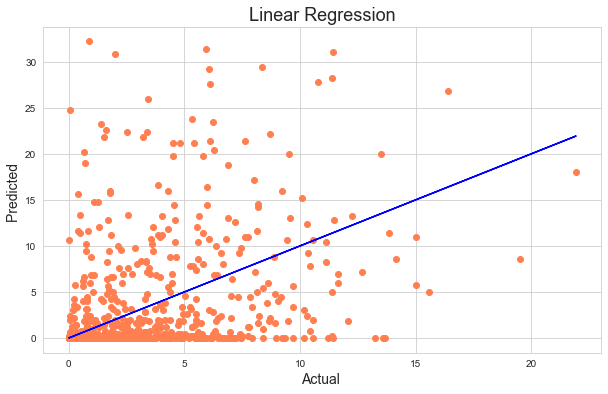

In [407]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='coral')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

## Ensemble Techniques (Boosting )
# Ada Boost

In [408]:
from sklearn.ensemble import AdaBoostRegressor
ada=AdaBoostRegressor()

#training_ada_Boost
ada.fit(x_train,y_train)
ada_score= ada.score(x_train,y_train)

#predict_ada_Boost
pred_train = ada.predict(x_train)
pred_test = ada.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  -0.28975790719312133 Testing Accuracy R2_score  -0.32801654532847757
Training Mean_squared_Error  28.821166014554496 Testing Mean_squared_error  30.37312698211745
Training Absolute_Error  4.166640382007482 Testing Absolute Error 4.208073154806291


## Cross Validation_Model

In [409]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    ada_cv_score=cross_val_score(ada,x,y,cv=i)
    cv_mean=ada_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score -0.07602509400887125 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD3, The Cross_Val_Score -0.16976112755404127 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD4, The Cross_Val_Score -0.09256101668723074 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD5, The Cross_Val_Score -0.03826463583980373 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD6, The Cross_Val_Score -0.10601526308053738 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD7, The Cross_Val_Score -0.06035720986137066 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD8, The Cross_Val_Score -0.10610007406437012 ,Training Score is -0.28975790719312133,Testing Score-0.32801654532847757
At CROSS_FOLD9, The Cross_Val_Score -0.013736458058491417 ,Training Score is -0.289

### As this Cross Fold 4 Cross_Val_Score is near to Training score

In [410]:
# pred training for Ada Boost
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Ada Boost
ada_cv_score=cross_val_score(ada,x,y,cv=4) 
ada_mean=ada_cv_score.mean() # mean value

print("Cv_score of Model is ",ada_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.013208567813544014  The Training Score is -0.28975790719312133 Testing Score Stands  -0.32801654532847757


### Graph

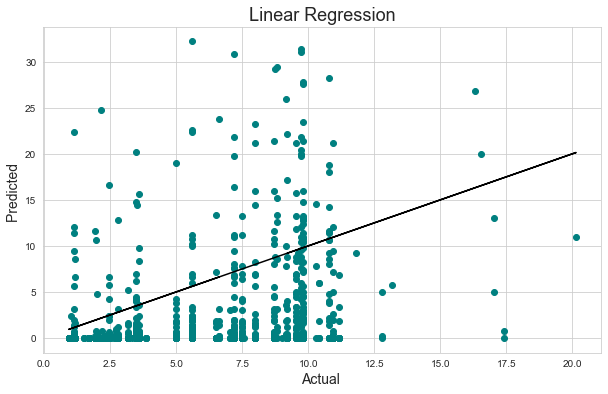

In [411]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='teal')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Gradient Boost

In [412]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()

#training_Gradient_Boost
gbr.fit(x_train,y_train)
gbr_score= gbr.score(x_train,y_train)

#predict_gbr
pred_train = gbr.predict(x_train)
pred_test = gbr.predict(x_test)

#result_gbr
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.3991078112491633 Testing Accuracy R2_score  0.2304827441396483
Training Mean_squared_Error  13.42764671745774 Testing Mean_squared_error  17.59966425824607
Training Absolute_Error  1.9125845314822625 Testing Absolute Error 2.1852072773321782


## Cross Validation_Model

In [413]:
from sklearn.model_selection import cross_val_score

# testing
train_accuracy=r2_score(y_train,pred_train)
test_accuracy =r2_score(y_test,pred_test)

#cross validation
for i in range(2,10):
    gbr_cv_score=cross_val_score(gbr,x,y,cv=i)
    cv_mean=gbr_cv_score.mean()
    
    print(f"At CROSS_FOLD{i}, Cross_Val_Score is {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score is 0.14886368476295664 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD3, Cross_Val_Score is 0.13954017128751686 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD4, Cross_Val_Score is 0.15510080732330558 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD5, Cross_Val_Score is 0.1700980208000549 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD6, Cross_Val_Score is 0.16936192222610513 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD7, Cross_Val_Score is 0.1857644065080297 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD8, Cross_Val_Score is 0.19563838025368957 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483
At CROSS_FOLD9, Cross_Val_Score is 0.17300205169446958 ,Training Score is 0.3991078112491633,Testing Score0.2304827441396483


### Selected Model Cross Fold 8 Cross_val_score is near to Training score

In [414]:
# pred training for Gradient Boost
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Gradient Boost
gbr_cv_score=cross_val_score(gbr,x,y,cv=8) 
gbr_mean=gbr_cv_score.mean() # mean value

print("Cv_score of Model is ",gbr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.19328448654742375  The Training Score is 0.3991078112491633 Testing Score Stands  0.2304827441396483


### Graph 

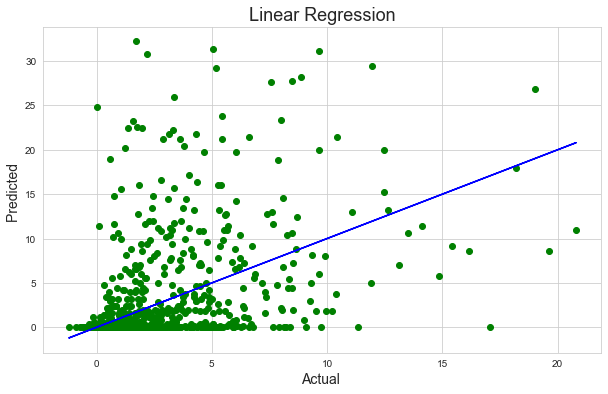

In [415]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='green')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Neural Network (MLPRegressor)

In [416]:
from sklearn.neural_network import MLPRegressor
mlp= MLPRegressor()

#training
#training_mlp
mlp.fit(x_train,y_train)
mlp_score= mlp.score(x_train,y_train)

#predict_mlp
pred_train = mlp.predict(x_train)
pred_test = mlp.predict(x_test)

#result_mlp
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.3387014385984647 Testing Accuracy R2_score  0.2550578367652906
Training Mean_squared_Error  14.777498565462068 Testing Mean_squared_error  17.037606193878123
Training Absolute_Error  2.075681940325333 Testing Absolute Error 2.245485715413379


## Model Cross Validation

In [417]:
from sklearn.model_selection import cross_val_score

# testing
train_accuracy=r2_score(y_train,pred_train)
test_accuracy =r2_score(y_test,pred_test)

#cross validation
for i in range(2,10):
    mlp_cv_score=cross_val_score(mlp,x,y,cv=i)
    cv_mean=mlp_cv_score.mean()
    
    print(f"At CROSS_FOLD{i}, Cross_Val_Score is {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score is 0.1430136293415018 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD3, Cross_Val_Score is 0.14410598097783045 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD4, Cross_Val_Score is 0.1592681683005376 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD5, Cross_Val_Score is 0.17792596947380088 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD6, Cross_Val_Score is 0.15531661235872637 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD7, Cross_Val_Score is 0.19415729762523348 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD8, Cross_Val_Score is 0.19490033358254183 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906
At CROSS_FOLD9, Cross_Val_Score is 0.17673975067171607 ,Training Score is 0.3387014385984647,Testing Score0.2550578367652906


### Selected Model Cross Fold 8 Cross_val_score is near to Training score

In [418]:
# pred training for MLP Regressor
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with MLP Regressor
mlp_cv_score=cross_val_score(mlp,x,y,cv=8) 
mlp_mean=mlp_cv_score.mean() # mean value

print("Cv_score of Model is ",mlp_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.19432054075101907  The Training Score is 0.3387014385984647 Testing Score Stands  0.2550578367652906


### Graph plot for Model

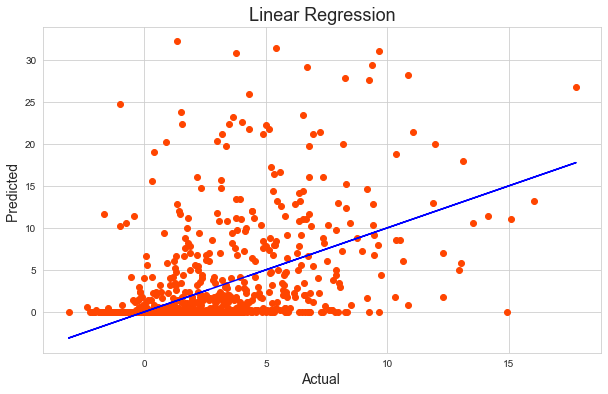

In [419]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orangered')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Bagging Regressor

In [420]:
from sklearn.ensemble import BaggingRegressor
br= BaggingRegressor()

#training
#training_mlp
br.fit(x_train,y_train)
br_score= br.score(x_train,y_train)

#predict_mlp
pred_train = br.predict(x_train)
pred_test = br.predict(x_test)

#result_mlp
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.8360393302219681 Testing Accuracy R2_score  0.08442323949382968
Training Mean_squared_Error  3.6638951055662186 Testing Mean_squared_error  20.940197851112817
Training Absolute_Error  0.9010690978886756 Testing Absolute Error 2.363453568687644


## Model Cross Validation

In [421]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    br_cv_score=cross_val_score(br,x,y,cv=i)
    cv_mean=br_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score -0.04476760968070781 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD3, The Cross_Val_Score -0.054473492905778596 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD4, The Cross_Val_Score -0.029285160442075936 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD5, The Cross_Val_Score -0.04223277685015383 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD6, The Cross_Val_Score -0.015150460504182653 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD7, The Cross_Val_Score 0.015132593090782695 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD8, The Cross_Val_Score 0.0322526282122477 ,Training Score is 0.8360393302219681,Testing Score0.08442323949382968
At CROSS_FOLD9, The Cross_Val_Score 0.023640830105299875 ,Training Score is 0.8360393302219681,Testing 

### Selected Cross Fold 4 Cross_Val_Score is near to training score.

In [422]:
# pred training for Random Forest
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Random Forest
br_cv_score=cross_val_score(br,x,y,cv=7) 
br_mean=br_cv_score.mean()

print("Cv_score of Model is ",br_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.025371952614814525  The Training Score is 0.8360393302219681 Testing Score Stands  0.08442323949382968


### Model Graph

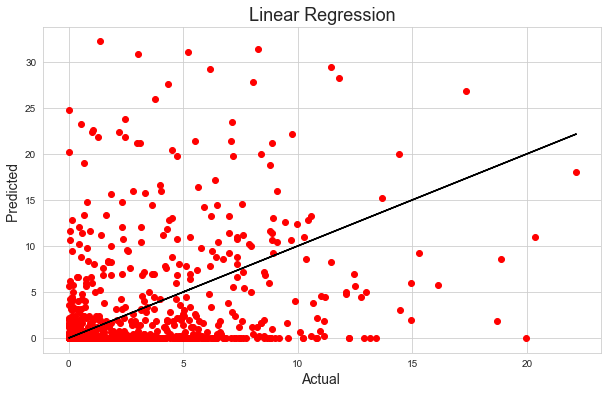

In [423]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='red')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Hyper-Parameter With Models
Extra Trees Regressor and Random Forest, Gradient Boost Regressor are working very close
we selected them due the following reasons:
- R2 Score is better for the model.
- CV Score better for these model they are nearer to training score.
- "MSE" and "MAE" are less on compare to other models.(They are close to the mean)

# Extra Tress Regressor

In [424]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()

parameters={'n_estimators':list(range(100,105)),
            'criterion':['squared_error', 'absolute_error'],
            'max_features':['sqrt', 'log2','None'],
           'random_state':[44]}

gsv=GridSearchCV(etr,parameters,cv=9)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'squared_error', 'max_features': 'sqrt', 'n_estimators': 104, 'random_state': 44} Best Score  0.2203747088900794


In [426]:
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor(criterion= 'squared_error',n_estimators= 104,max_features= 'sqrt', n_jobs=2)

#training score
etr.fit(x_train,y_train)
etr_score=etr.score(x_train,y_train)

#predict
pred_train=etr.predict(x_train)
pred_test=etr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test)) 

Training Accuracy r2_score  0.9999999999364695 Testing Accuracy R2_score  0.24923524851570267
Training Mean_squared_Error  1.4196640506996115e-09 Testing Mean_squared_error  17.17077487531618
Training Absolute_Error  7.382253085394394e-07 Testing Absolute Error 2.172034210992385


## Cross Validation_Model

In [427]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    etr_cv_score=cross_val_score(etr,x,y,cv=i)
    cv_mean=etr_cv_score.mean()

    print(f"At CROSS_FOLD {i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD 2, The Cross_Val_Score 0.1593266212626595 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 3, The Cross_Val_Score 0.15737374206711438 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 4, The Cross_Val_Score 0.1652425006742717 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 5, The Cross_Val_Score 0.18029261785359357 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 6, The Cross_Val_Score 0.17115803261237797 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 7, The Cross_Val_Score 0.18966685394584687 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 8, The Cross_Val_Score 0.1907565686465519 ,Training Score is 0.9999999999364695,Testing Score0.24923524851570267
At CROSS_FOLD 9, The Cross_Val_Score 0.18963325153225088 ,Training Score is 0.9999999999364695,Testing Scor

### Selected cross fold 18 as cv score is close to Traning Score

In [329]:
# pred training for Extra Trees
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Extra Trees
etr_cv_score=cross_val_score(etr,x,y,cv=18) 
etr_mean=etr_cv_score.mean() #mean value

print("Cv_score of Model is ",etr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.18976212011106564  The Training Score is 0.8860327412060351 Testing Score Stands  0.18870173496918985


### Graph

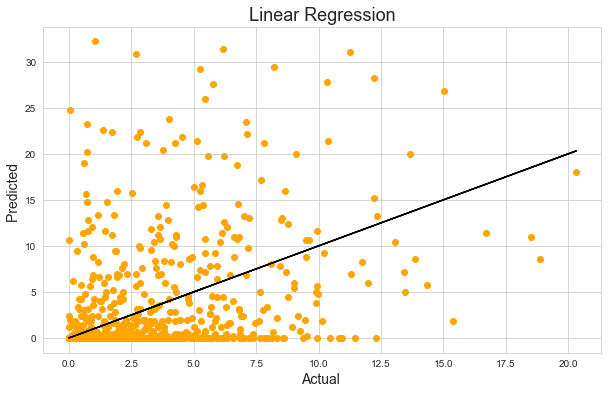

In [330]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orange')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# MLP Regressor

In [331]:
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
etr=MLPRegressor()

parameters={'activation':['identity', 'logistic', 'tanh', 'relu'],
            'solver':['lbfgs','sgd','adam'],
            'learning_rate':['constant', 'invscaling', 'adaptive'],
            'max_iter':[200],
           'random_state':[44]}

gsv=GridSearchCV(etr,parameters,cv=8)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'activation': 'relu', 'learning_rate': 'constant', 'max_iter': 200, 'random_state': 44, 'solver': 'sgd'} Best Score  0.22383347615771032


In [333]:
from sklearn.neural_network import MLPRegressor
mlp= MLPRegressor(activation='relu', learning_rate= 'constant', max_iter= 200, random_state =44, 
                  solver= 'sgd',beta_2=0.999,validation_fraction=0.1)

#training
#training_mlp
mlp.fit(x_train,y_train)
mlp_score= mlp.score(x_train,y_train)

#predict_mlp
pred_train1 = mlp.predict(x_train)
pred_test1 = mlp.predict(x_test)

#result_mlp
print("Training Accuracy r2_score ",r2_score(y_train,pred_train1),"Testing Accuracy R2_score ",r2_score(y_test,pred_test1))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train1),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test1))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train1),"Testing Absolute Error",mean_absolute_error(y_test,pred_test1))

Training Accuracy r2_score  0.338681648709402 Testing Accuracy R2_score  0.24688261310915127
Training Mean_squared_Error  14.777940793941463 Testing Mean_squared_error  17.22458210700857
Training Absolute_Error  2.1180229699792026 Testing Absolute Error 2.2696630079877957


## Cross Validation_Model

In [334]:
from sklearn.model_selection import cross_val_score

# testing
train_accuracy=r2_score(y_train,pred_train1)
test_accuracy =r2_score(y_test,pred_test1)

#cross validation
for i in range(2,10):
    mlp_cv_score=cross_val_score(mlp,x,y,cv=i)
    cv_mean=mlp_cv_score.mean()
    
    print(f"At CROSS_FOLD{i}, Cross_Val_Score is {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score is 0.13627406959720084 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD3, Cross_Val_Score is 0.14787268962327668 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD4, Cross_Val_Score is 0.16007594334505193 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD5, Cross_Val_Score is 0.1730054416938236 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD6, Cross_Val_Score is 0.16803841963673016 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD7, Cross_Val_Score is 0.19263669735752173 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD8, Cross_Val_Score is 0.18920211262735195 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127
At CROSS_FOLD9, Cross_Val_Score is 0.1870314169304614 ,Training Score is 0.338681648709402,Testing Score0.24688261310915127


### Selected cross fold 8 as cv score is close to Traning Score

In [335]:
# pred training for MLP Regressor
train_accuracy=r2_score(y_train,pred_train1)
test_accuracy=r2_score(y_test,pred_test1)

#cross val with MLP Regressor
mlp_cv_score=cross_val_score(mlp,x,y,cv=8) 
mlp_mean=mlp_cv_score.mean() # mean value

print("Cv_score of Model is ",mlp_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.18920211262735195  The Training Score is 0.338681648709402 Testing Score Stands  0.24688261310915127


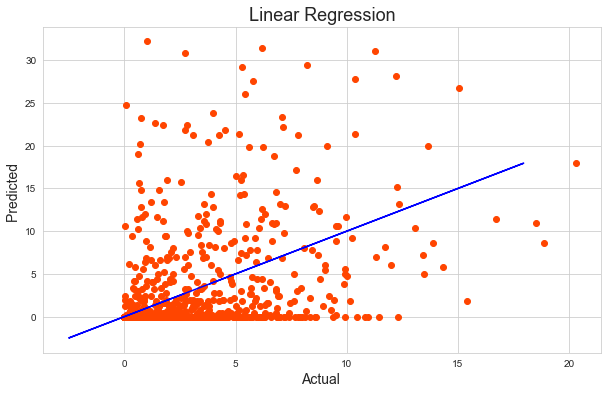

In [336]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orangered')
plt.plot(pred_test1,pred_test1,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

In [340]:
pred_en=en.predict(x_test) # predict test

en_cv_score=cross_val_score(mlp,x,y,cv=8)
en_cv_mean=en_cv_score.mean()
en_cv_mean*100

18.920211262735194

### Both are Working at Same 

## Tried to Boost up.

Cv_score of Model is  0.18920211262735195
The Training Score is 0.338681648709402
Testing Score Stands  0.24688261310915127

- Training score,Testing score is close to cv_score. 

# Saving Model

In [341]:
import pickle
filename='reg_modelrain.pkl'
pickle.dump(mlp,open(filename,'wb'))

In [342]:
import pickle
loaded_model =pickle.load(open('reg_modelrain.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

24.688261310915127


In [343]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],pred_test1[:]],index=["Predicted","Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021